# **Exploratory Data Analysis for Health_insurance_cost dataset**

## **Overview**
#### In this exploratory data analysis (EDA) project, we aim to gain insights into the "Health_insurance_cost" dataset, which contains information about insurance policyholders. The dataset includes variables such as age, gender, BMI (Body Mass Index), number of children, smoking status, location and health insurance prices. By conducting a thorough analysis, we seek to understand patterns, relationships, and trends within the data that can inform decision-making and provide valuable insights into the characteristics of policyholders.


## **Dataset Description**
#### **Age:** Age of the policyholder.
#### **Gender:** Gender of the policyholder.
#### **BMI:** Body Mass Index of the policyholder.
#### **Children:** Number of children or dependents covered by the insurance.
#### **Smoking_status:** Smoking status of the policyholder (yes/no).
#### **Location:** Geographic location of the policyholder.
#### **Health_insurance_price:** Insurance charges incurred by the policyholder.

## **Main Objectives**
#### **Demographic Analysis:** Explore the distribution of age, gender, and region within the dataset.
#### **BMI and Cost:** Investigate the relationship between BMI and insurance charges.
#### **Smoking Impact:** Analyze the impact of smoking status on insurance charges.
#### **Family Size Influence:** Examine how the number of children influences insurance charges.
#### **Location Influence:** Explore variations in insurance charges across different locations.
#### **Influence of Age:** Explore variations in insurance charges across different age groups.

## **Significance**
#### Understanding the factors that influence insurance charges is crucial for insurance companies in pricing policies and making proper business decisions.The aim of this analysis to uncover key insights that can contribute to strategic planning for customer-centric policies. By the end we aim to provide a comprehensive understanding of the "Health_insurance_cost" dataset and generate actionable insights that can benefit insurance stakeholders.

## **Structure of the Analysis:**
#### **1) Basic Data Exploration**
#### **2) Data Cleaning and Preprocessing**: Includes detection and treating/removing missing data , duplicates and noisy data or outliers
#### **3) Demographic Analysis**: Univariate analysis of demographic data (distribution of Age , Gender , Location etc.)
#### **4) Bivariate Analysis**: BMI and Cost , Smoking Impact on Cost , Family Size Influence on Cost , Location Influence on Cost, Age vs BMI relation, Smoking status vs Age relation and BMI vs Smoking status relation.
#### **5) Multivariate Analysis**: Impact of Age and BMI together on cost, Impact of Age and Smoking status together on cost, Impact of Smoking status and BMI together on cost

#### Our analysis will involve descriptive statistics, data visualizations (e.g. histograms, box plots etc.), and statistical tests to uncover patterns and relationships within the dataset.

## **Data Collection**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

data=pd.read_excel('Health_insurance_cost.xlsx')

## **Initial analysis**

#### **Shape of Dataset**

In [2]:
data.shape

(1338, 7)

#### **Structure of the Data**

In [3]:
data.sample(6)

,age,gender,BMI,Children,smoking_status,location,health_insurance_price
781,18.0,male,41.140,0,no,southeast,1146.79660
1296,18.0,male,26.125,0,no,northeast,1708.92575
742,53.0,male,34.105,0,yes,northeast,43254.41795
736,37.0,female,38.390,0,yes,southeast,40419.01910
1045,43.0,female,24.700,2,yes,northwest,21880.82000
499,62.0,female,39.200,0,no,southwest,13470.86000


#### **Type of Data**

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   age                     1310 non-null   float64
 1   gender                  1338 non-null   object 
 2   BMI                     1315 non-null   float64
 3   Children                1338 non-null   int64  
 4   smoking_status          1338 non-null   object 
 5   location                1338 non-null   object 
 6   health_insurance_price  1336 non-null   float64
dtypes: float64(3), int64(1), object(3)
memory usage: 73.3+ KB


#### **Checking for missing values**

In [5]:
round(data.isnull().sum()/data.shape[0]*100,2).sort_values(ascending=False)

age                       2.09
BMI                       1.72
health_insurance_price    0.15
gender                    0.00
Children                  0.00
smoking_status            0.00
location                  0.00
dtype: float64

#### **Statistical Summary**

In [6]:
data.describe(include='all')

,age,gender,BMI,Children,smoking_status,location,health_insurance_price
count,1310.000000,1338,1315.000000,1338.000000,1338,1338,1336.000000
unique,NaN,2,NaN,NaN,2,4,NaN
top,NaN,male,NaN,NaN,no,southeast,NaN
freq,NaN,676,NaN,NaN,1064,364,NaN
mean,39.166412,NaN,30.638217,1.094918,NaN,NaN,13268.527719
std,14.055378,NaN,6.110302,1.205493,NaN,NaN,12112.797724
min,18.000000,NaN,15.960000,0.000000,NaN,NaN,1121.873900
25%,26.000000,NaN,26.210000,0.000000,NaN,NaN,4744.325050
50%,39.000000,NaN,30.305000,1.000000,NaN,NaN,9382.033000
75%,51.000000,NaN,34.580000,2.000000,NaN,NaN,16604.302645


#### **Checking for duplicates and removing if there any**

In [7]:
print(data.duplicated().sum())
data[data.duplicated()]

1


,age,gender,BMI,Children,smoking_status,location,health_insurance_price
581,19.0,male,30.59,0,no,northwest,1639.5631


In [8]:
data.drop_duplicates(inplace=True)

## **Data Cleaning and pre processing**

In [9]:
len(data[['age','BMI','health_insurance_price']].dropna())/len(data)*100

96.03590127150336

#### **First checking the changes in distribution by removing the missing values**

#### Creating a temporary dataset consist of only the columns from where the value is dropped

In [10]:
tempdata1=data[['age','BMI','health_insurance_price']].dropna()

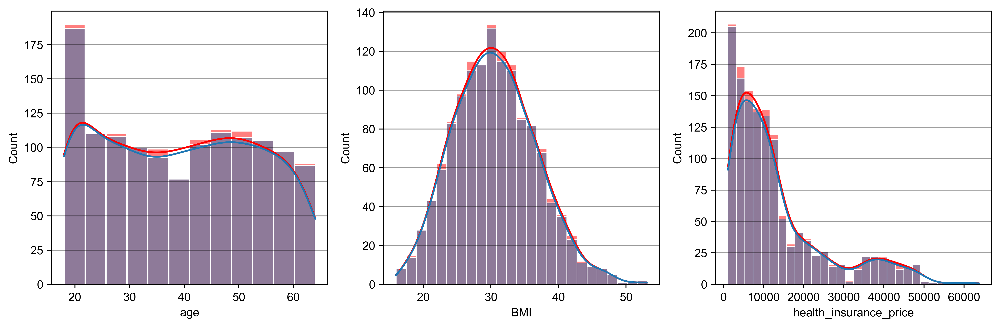

In [11]:
fig,ax=plt.subplots(1,3,figsize=(12,4),dpi=500)
sns.set_style('dark')
sns.histplot(data['age'],kde=True,color='red',ax=ax[0])
sns.histplot(tempdata1['age'],kde=True,ax=ax[0])
ax[0].grid(axis='y',color='black',alpha=0.4)

sns.histplot(data['BMI'],kde=True,color='red',ax=ax[1])
sns.histplot(tempdata1['BMI'],kde=True,ax=ax[1])
ax[1].grid(axis='y',color='black',alpha=0.4)

sns.histplot(data['health_insurance_price'],kde=True,color='red',ax=ax[2])
sns.histplot(tempdata1['health_insurance_price'],kde=True,ax=ax[2])
ax[2].grid(axis='y',color='black',alpha=0.4)

plt.tight_layout()
plt.show()

#### We have observed that removing all the missing values from the dataset preserves approx 96% of the records and comparing the distribution of data before and after removal of the data also remains almost same or having very minor changes which can be overlooked so removing is a safe option.

#### **Now checking the changes in distribution by imputing the values with mean/median**

In [12]:
tempdata2=data[['age','BMI','health_insurance_price']]

In [13]:
tempdata2['age'].fillna(tempdata2['age'].median(),inplace=True)
tempdata2['BMI'].fillna(tempdata2['BMI'].mean(),inplace=True)
tempdata2['health_insurance_price'].fillna(tempdata2['health_insurance_price'].median(),inplace=True)

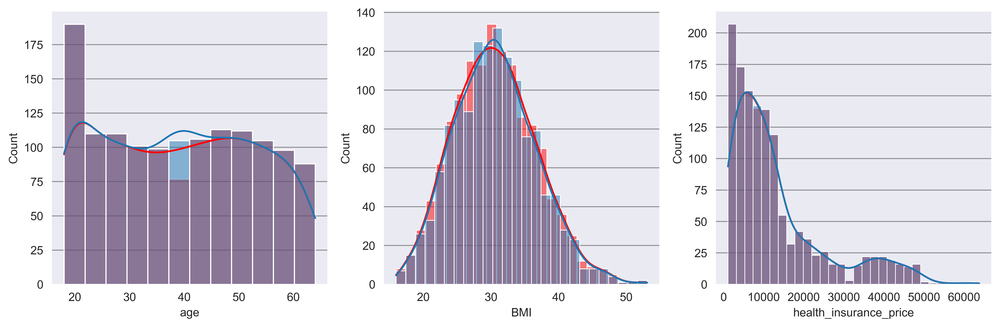

In [14]:
fig,ax=plt.subplots(1,3,figsize=(12,4),dpi=500)
sns.set_style('dark')
sns.histplot(data['age'],kde=True,color='red',ax=ax[0])
sns.histplot(tempdata2['age'],kde=True,ax=ax[0])
ax[0].grid(axis='y',color='black',alpha=0.4)

sns.histplot(data['BMI'],kde=True,color='red',ax=ax[1])
sns.histplot(tempdata2['BMI'],kde=True,ax=ax[1])
ax[1].grid(axis='y',color='black',alpha=0.4)

sns.histplot(data['health_insurance_price'],kde=True,color='red',ax=ax[2])
sns.histplot(tempdata2['health_insurance_price'],kde=True,ax=ax[2])
ax[2].grid(axis='y',color='black',alpha=0.4)

plt.tight_layout()
plt.show()

#### We have compared the distribution of data before and after imputation and observed that for 'age' and 'BMI' the retention of the actual distribution was better in case of removal but in the case of 'BMI' we are having minor changes over the distribution and in the case of 'health_insurance_price' we are getting perfectly matched distribution so we will remove the missing values in the case of 'age' and for 'BMI' and 'health_insurance_price' we will impute with mean and median respectively to lose the smallest amount of data as our dataset is small

#### **Cleaning the actual dataset**

In [15]:
data['BMI'].fillna(data['BMI'].mean(),inplace=True)
data['health_insurance_price'].fillna(data['health_insurance_price'].median(),inplace=True)
data.dropna(subset={'age'},inplace=True)

#### **Adjust values of few columns**

In [16]:
data['age']=data['age'].astype('int64')
data['BMI']=data['BMI'].round(1)

#### **Transforming the value of Children Column**

In [17]:
data.loc[data['Children']==0,'Children']='Zero'
data.loc[data['Children']==1,'Children']='One'
data.loc[data['Children']==2,'Children']='Two'
data.loc[data['Children']==3,'Children']='Three'
data.loc[data['Children']==4,'Children']='Four'
data.loc[data['Children']==5,'Children']='Five'

#### Although Children column represents numeric data but it is suggesting category wise value rather than series of numeric value so to make analysis easier we are transforming the value accordingly

In [18]:
data.sample(6)

,age,gender,BMI,Children,smoking_status,location,health_insurance_price
785,35,female,27.7,Three,no,southwest,6414.17800
1199,31,female,25.8,Two,no,southwest,4934.70500
221,53,female,33.2,Zero,no,northeast,10564.88450
17,23,male,23.8,Zero,no,northeast,2395.17155
285,46,male,26.6,One,no,southeast,7742.10980
10,25,male,26.2,Zero,no,northeast,2721.32080


## **Univariate Analysis**

#### In this analysis we will analyze each and every variable separately to understand their pattern or distribution

#### **Age**

#### **We are further creating an age group column to segregate the policyholders based on their age**

In [19]:
def agegrp(age):
    if age<20:
        return 'Teenager'
    elif (age>=20 and age<=29):
        return '20s'
    elif (age>=30 and age<=39):
        return '30s'    
    elif (age>=40 and age<=49):
        return '40s'
    elif (age>=50 and age<=59):
        return '50s'  
    elif (age>=60):
        return 'Senior'

data['age_group']=data['age'].apply(agegrp)

#### In this above code we are segregating policyholders based on their age group and creating a new column to analyse more, we have basically created a function that will assign an age group based on the age of policyholders.

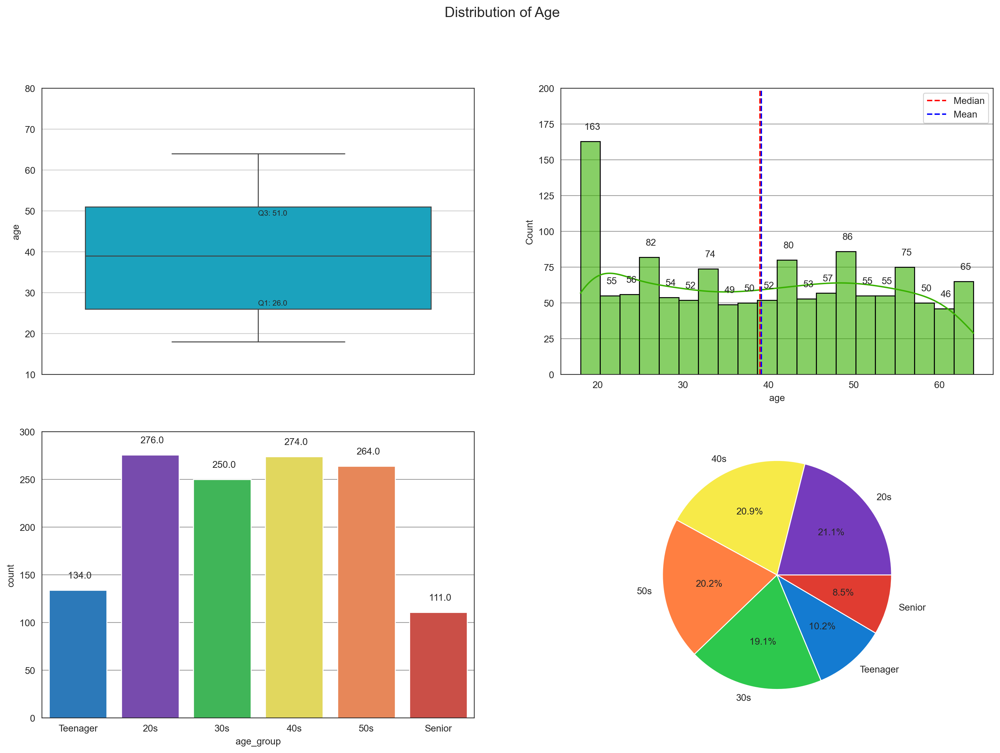

Minimum age: 18
Maximum age: 64
Median age: 39.0
Standard deviation: 14.049680508102698
Average age: 39.18181818181818


In [20]:
q1,q3=data['age'].quantile([0.25,0.75])

sns.set_style('white')
fig,ax=plt.subplots(2,2,figsize=(18,12),dpi=200)
sns.boxplot(y='age',data=data,ax=ax[0,0],color='#00b4d8')
plot1=sns.histplot(x='age',data=data,kde=True,ax=ax[0,1],color='#38b000',alpha=0.6,edgecolor='black',bins=20)
plot2=sns.countplot(x=data['age_group'],ax=ax[1,0],palette=['#147bd1','#753bbd','#2dc84d','#f7ea48','#ff7f41','#e03c31'],order=['Teenager','20s','30s','40s','50s','Senior'])
ax[1,1].pie(data['age_group'].value_counts().values,labels=data['age_group'].value_counts().index,autopct='%1.1f%%',colors=['#753bbd','#f7ea48','#ff7f41','#2dc84d','#147bd1','#e03c31'])
ax[0,0].set_ylim(10,80)
ax[0,1].set_ylim(0,200)
ax[1,0].set_ylim(0,300)
ax[0,0].text(0, q1+1, f'Q1: {q1:.1f}',fontsize=8)
ax[0,0].text(0, q3-2, f'Q3: {q3:.1f}',fontsize=8)
ax[0,0].grid(axis='y',color='black',alpha=0.2)
ax[0,1].grid(axis='y',color='black',alpha=0.4)
ax[1,0].grid(axis='y',color='black',alpha=0.4)
ax[0,1].axvline(data['age'].median(),linestyle='--',label='Median',color='red')
ax[0,1].axvline(data['age'].mean(),linestyle='--',label='Mean',color='blue')
for plot in [plot1,plot2]:
    for p in plot.patches:
        plot.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),ha='center', va='center', xytext=(2, 15), textcoords='offset points')
fig.suptitle('Distribution of Age',fontsize=15)
plt.subplots_adjust(wspace=0.2)
ax[0,1].legend()
plt.show()

print('Minimum age: {}'.format(data['age'].min()))
print('Maximum age: {}'.format(data['age'].max()))
print('Median age: {}'.format(data['age'].median()))
print('Standard deviation: {}'.format(data['age'].std()))
print('Average age: {}'.format(data['age'].mean()))

#### From the above plots we can say that almost 53% are between the age of 26 to 51 years and the median age is 39 years. From the distribution we can say that we have seen peak under the age of 30 years and also observed peak in the distribution from almost 45-55 years of age, as the distribution is not enough to properly have the idea about age groups so we have also categorize the policyholders based on their age and we have observed there are 10.2% (134) of policyholders are under 20 years of age. 21.1% (276) of policyholders are between 20-29 years of age, 19.1% (250) of policyholders are between 30-39 years of age, 20.9% (274) of policyholders are between 40-49 years of age, 20.2% (264) of policyholders are between 50-59 years of age and 8.5% (111) of policyholders are above 60 years of age (Senior).

#### **BMI**

#### **We are further creating an BMI group column to segregate the policyholders based on their BMI**

In [21]:
def agegrp(bmi):
    if bmi<18.5:
        return 'Underweight'
    elif (bmi>=18.5 and bmi<=24.9):
        return 'Healthy'
    elif (bmi>=25 and bmi<=29.9):
        return 'Overweight'    
    elif (bmi>=30 and bmi<=34.9):
        return 'Obese'
    elif (bmi>=35 and bmi<=39.9):
        return 'Class 2 Obese'  
    elif (bmi>=40):
        return 'Class 3 Obese'

data['BMI_group']=data['BMI'].apply(agegrp)

#### In this above code we are segregating policyholders based on their BMI group and creating a new column to analyse more, we have basically created a function that will assign an BMI group based on the BMI of policyholders.

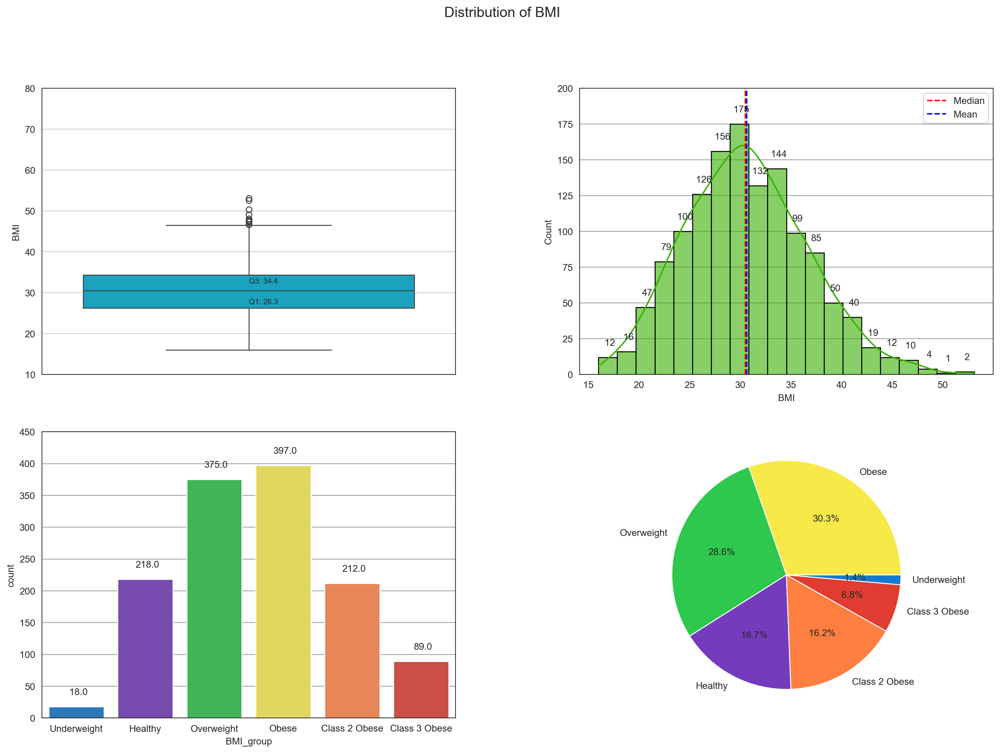

Minimum BMI: 16.0
Maximum BMI: 53.1
Average BMI: 30.62513368983957
Standard deviation: 6.056907946281505


In [22]:
q1,q3=data['BMI'].quantile([0.25,0.75])

sns.set_style('white')
fig,ax=plt.subplots(2,2,figsize=(18,12),dpi=200)
sns.boxplot(y='BMI',data=data,ax=ax[0,0],color='#00b4d8')
plot1=sns.histplot(x='BMI',data=data,kde=True,ax=ax[0,1],color='#38b000',alpha=0.6,edgecolor='black',bins=20)
plot2=sns.countplot(x=data['BMI_group'],ax=ax[1,0],palette=['#147bd1','#753bbd','#2dc84d','#f7ea48','#ff7f41','#e03c31'],order=['Underweight','Healthy','Overweight','Obese','Class 2 Obese','Class 3 Obese'])
ax[1,1].pie(data['BMI_group'].value_counts().values,labels=data['BMI_group'].value_counts().index,colors=['#f7ea48','#2dc84d','#753bbd','#ff7f41','#e03c31','#147bd1'],autopct='%1.1f%%')
ax[0,0].set_ylim(10,80)
ax[0,1].set_ylim(0,200)
ax[1,0].set_ylim(0,450)
ax[0,0].text(0, q1+1, f'Q1: {q1:.1f}',fontsize=8)
ax[0,0].text(0, q3-2, f'Q3: {q3:.1f}',fontsize=8)
ax[0,0].grid(axis='y',color='black',alpha=0.2)
ax[0,1].grid(axis='y',color='black',alpha=0.4)
ax[1,0].grid(axis='y',color='black',alpha=0.4)
ax[0,1].axvline(data['BMI'].median(),linestyle='--',label='Median',color='red')
ax[0,1].axvline(data['BMI'].mean(),linestyle='--',label='Mean',color='blue')
for plot in [plot1,plot2]:
    for p in plot.patches:
        plot.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),ha='center', va='center', xytext=(2, 15), textcoords='offset points')
fig.suptitle('Distribution of BMI',fontsize=15)
plt.subplots_adjust(wspace=0.3)
ax[0,1].legend()
plt.show()

print('Minimum BMI: {}'.format(data['BMI'].min()))
print('Maximum BMI: {}'.format(data['BMI'].max()))
print('Average BMI: {}'.format(data['BMI'].mean()))
print('Standard deviation: {}'.format(data['BMI'].std()))

#### From the distributions and plots we have observed that 50% of the policyholders are having BMI range between 26.3 to 34.4 and average BMI is approx 30.62 which denotes obesity. We have maximum number of observations between the BMI ranges from little above 20 to little below 40. And we have a few extremely high BMI values (outliers) as well. The distribution is almost normal. From all of the observations we have 1.4% (18) policyholders who are underweight, 16.7% (218) policyholders who are healthy, 28.6% (375) policyholders who are overweight, 30.3% (397) policyholders are obese, 16.2% (212) policyholders are having class 2 obesity and 6.8% (89) policyholders are having class 3 obesity.

#### **Gender**

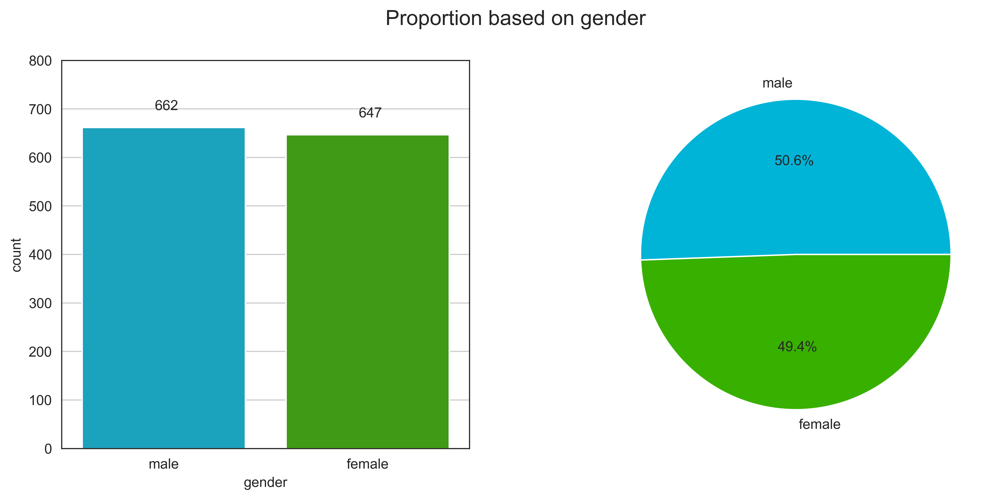

In [23]:
sns.set_style('white')
fig,ax=plt.subplots(1,2,figsize=(12,5),dpi=500)
plot=sns.countplot(x='gender',data=data,ax=ax[0],hue=data['gender'],palette=['#38b000','#00b4d8',],order=data['gender'].value_counts().index)
ax[1].pie(data['gender'].value_counts().values/len(data)*100,labels=data['gender'].value_counts().index,colors=['#00b4d8', '#38b000'],autopct='%1.1f%%')
ax[0].grid(axis='y',color='black',alpha=0.2)
ax[0].set_ylim(0,800)
fig.suptitle('Proportion based on gender',fontsize=15)
plt.subplots_adjust(wspace=0.3)
for p in plot.patches:
    plot.annotate('{:.0f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),ha='center', va='center', xytext=(2, 15), textcoords='offset points')

# plt.tight_layout()
plt.show()

#### From the above observation we saw that we have 662 which is 50.6% male policyholders which is 50.6% of total policyholders and 647 female policyholders which is 49.4% of total policyholders. So we are having almost equal number of distribution in terms of gender

#### **Children**

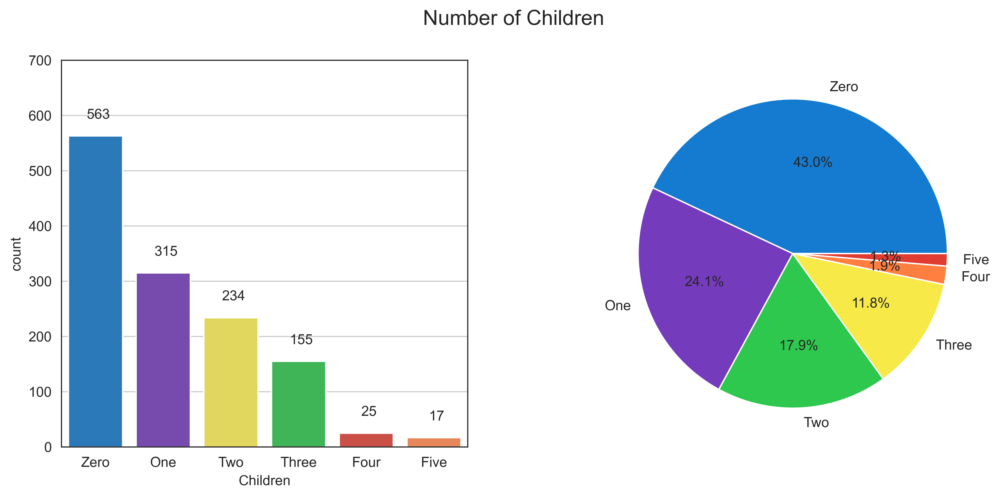

In [24]:
sns.set_style('white')
fig,ax=plt.subplots(1,2,figsize=(12,5),dpi=500)
plot=sns.countplot(x='Children',data=data,ax=ax[0],hue=data['Children'],palette=['#147bd1','#753bbd','#2dc84d','#f7ea48','#ff7f41','#e03c31'],order=data['Children'].value_counts().index)
ax[1].pie(data['Children'].value_counts().values/len(data)*100,labels=data['Children'].value_counts().index,colors=['#147bd1','#753bbd','#2dc84d','#f7ea48','#ff7f41','#e03c31'],autopct='%1.1f%%')
ax[0].grid(axis='y',color='black',alpha=0.2)
ax[0].set_ylim(0,700)
fig.suptitle('Number of Children',fontsize=15)
plt.subplots_adjust(wspace=0.3)
for p in plot.patches:
    plot.annotate('{:.0f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),ha='center', va='center', xytext=(2, 15), textcoords='offset points')
plt.show()

#### Although 'Children' columns hold numeric value but it is suggesting more of categories rather than a series of numeric values so we have used countplot and pie chart for better analysis.
#### We have seen that majority of policyholders don't have children which is 563 (43%). Then 315 (24.1%) policyholders have 1 child, 234 (17.9%) policyholders have 2 children, 155 (11.8%) policyholders have 3 children, 25 (1.9%) policyholders have 4 children and least amount of policyholders have 5 children which is 17 (1.3%).

#### **Smoking_status**

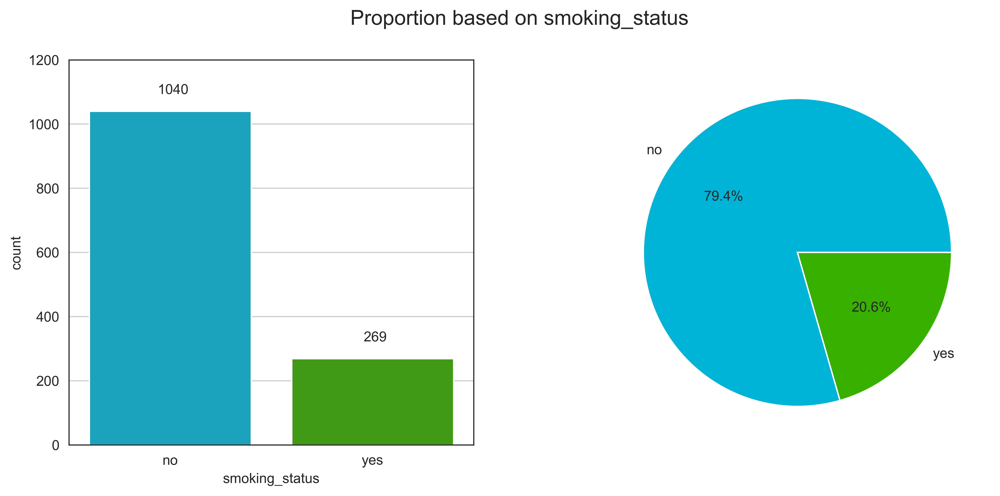

In [25]:
sns.set_style('white')
fig,ax=plt.subplots(1,2,figsize=(12,5),dpi=500)
plot=sns.countplot(x='smoking_status',data=data,ax=ax[0],hue=data['smoking_status'],palette=['#38b000','#00b4d8'],order=data['smoking_status'].value_counts().index)
ax[1].pie(data['smoking_status'].value_counts().values/len(data)*100,labels=data['smoking_status'].value_counts().index,colors=['#00b4d8', '#38b000'],autopct='%1.1f%%')
ax[0].grid(axis='y',color='black',alpha=0.2)
ax[0].set_ylim(0,1200)
fig.suptitle('Proportion based on smoking_status',fontsize=15)
plt.subplots_adjust(wspace=0.3)
for p in plot.patches:
    plot.annotate('{:.0f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),ha='center', va='center', xytext=(2, 15), textcoords='offset points')

# plt.tight_layout()
plt.show()

#### We have observed that 79.4% (1040) policyholders are non smokers and 20.6% (269) policyholders are smokers.

#### **Location**

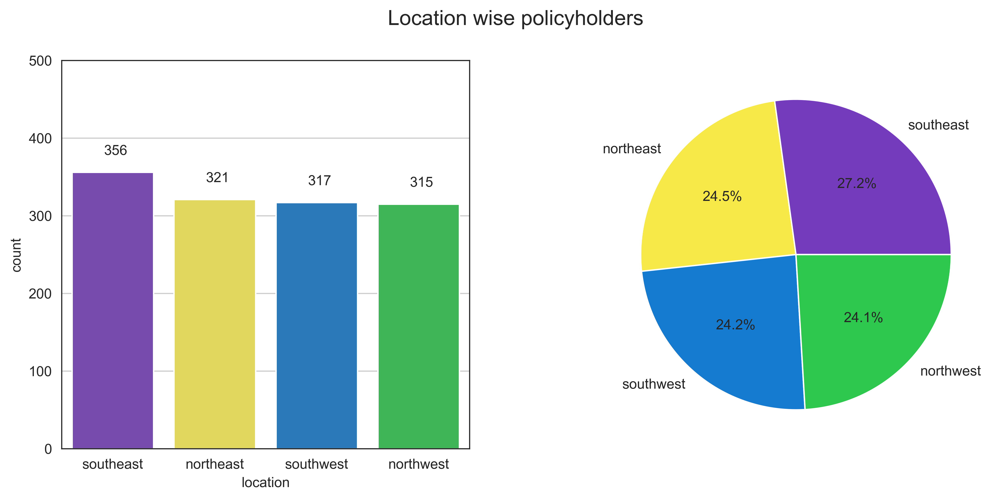

In [26]:
sns.set_style('white')
fig,ax=plt.subplots(1,2,figsize=(12,5),dpi=500)
plot=sns.countplot(x='location',data=data,ax=ax[0],hue=data['location'],order=data['location'].value_counts().index,palette=['#147bd1','#753bbd','#2dc84d','#f7ea48'])
ax[1].pie(data['location'].value_counts().values/len(data)*100,labels=data['location'].value_counts().index,colors=['#753bbd','#f7ea48','#147bd1','#2dc84d'],autopct='%1.1f%%')
ax[0].grid(axis='y',color='black',alpha=0.2)
ax[0].set_ylim(0,500)
fig.suptitle('Location wise policyholders',fontsize=15)
plt.subplots_adjust(wspace=0.3)
for p in plot.patches:
    plot.annotate('{:.0f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),ha='center', va='center', xytext=(2, 15), textcoords='offset points')
plt.show()

#### We have observed that 27.2% (356) of policyholders are from southeast region, 24.5% (321) of policyholders are from northeast region, 24.2% (317) of policyholders are from southwest region, 24.1% (356) of policyholders are from northwest region

#### **Health insurance price**

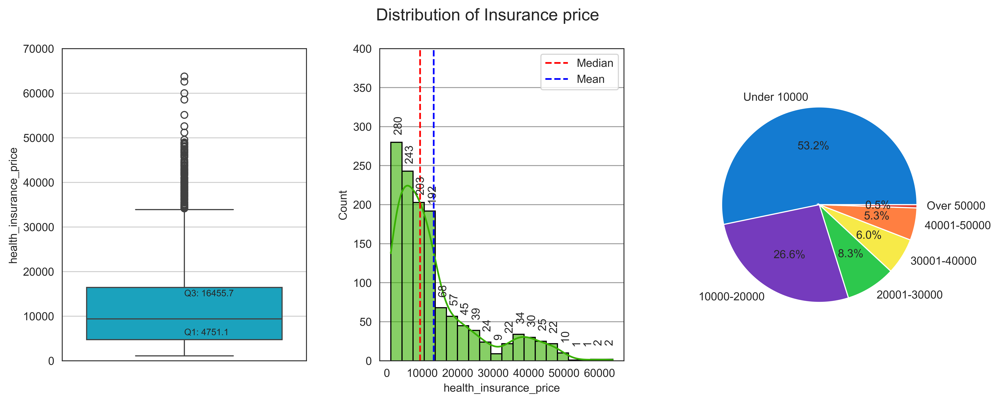

Minimum health_insurance_price: 1121.8739
Maximum health_insurance_price: 63770.42801
Median health_insurance_price: 9386.1613
Standard deviation: 12083.082166096607
Average health_insurance_price: 13228.871029655462
Max limit : 34012.664625




In [27]:
q1,q3=data['health_insurance_price'].quantile([0.25,0.75])
IQR=q3-q1
max=q3+(1.5*IQR)

sns.set_style('white')
fig,ax=plt.subplots(1,3,figsize=(14,5),dpi=500)
sns.boxplot(y='health_insurance_price',data=data,ax=ax[0],color='#00b4d8')
plot=sns.histplot(x='health_insurance_price',data=data,kde=True,ax=ax[1],color='#38b000',alpha=0.6,edgecolor='black',bins=20)
ax[0].set_ylim(0,70000)
ax[1].set_ylim(0,400)
ax[0].text(0, q1+1000, f'Q1: {q1:.1f}',fontsize=8)
ax[0].text(0, q3-2000, f'Q3: {q3:.1f}',fontsize=8)
ax[0].grid(axis='y',color='black',alpha=0.2)
ax[1].grid(axis='y',color='black',alpha=0.4)
ax[1].axvline(data['health_insurance_price'].median(),linestyle='--',label='Median',color='red')
ax[1].axvline(data['health_insurance_price'].mean(),linestyle='--',label='Mean',color='blue')
for p in plot.patches:
    plot.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),ha='center', va='center', xytext=(2, 15), textcoords='offset points',rotation=90)
fig.suptitle('Distribution of Insurance price',fontsize=15)
plt.subplots_adjust(wspace=0.3)
# plt.tight_layout()
hi1=data[data['health_insurance_price']<10000]['health_insurance_price'].count()
hi2=data[(data['health_insurance_price']>=10000) & (data['health_insurance_price']<=20000)]['health_insurance_price'].count()
hi3=data[(data['health_insurance_price']>=20001) & (data['health_insurance_price']<=30000)]['health_insurance_price'].count()
hi4=data[(data['health_insurance_price']>=30001) & (data['health_insurance_price']<=40000)]['health_insurance_price'].count()
hi5=data[(data['health_insurance_price']>=40001) & (data['health_insurance_price']<=50000)]['health_insurance_price'].count()
hi6=data[data['health_insurance_price']>=50001]['BMI'].count()
ax[2].pie([hi1,hi2,hi3,hi4,hi5,hi6],labels=['Under 10000','10000-20000','20001-30000','30001-40000','40001-50000','Over 50000'],colors=['#147bd1','#753bbd','#2dc84d','#f7ea48','#ff7f41','#e03c31'],autopct='%1.1f%%')
ax[1].legend()
plt.show()

print('Minimum health_insurance_price: {}'.format(data['health_insurance_price'].min()))
print('Maximum health_insurance_price: {}'.format(data['health_insurance_price'].max()))
print('Median health_insurance_price: {}'.format(data['health_insurance_price'].median()))
print('Standard deviation: {}'.format(data['health_insurance_price'].std()))
print('Average health_insurance_price: {}'.format(data['health_insurance_price'].mean()))
print('Max limit : {}'.format(max))
print('\n')

#### We have observed that the distribution is right skewed and most of the policyholders are getting low priced health insurance. Median price of health insurance is 9386. We have total 53.2% policyholders receiving health insurance below 10000, 26.6% are receiving under 20000 so most of the policyholders are receiving health insurance under or equal to 20000. We have 8.3% policyholders receiving under 30000, 6% under 40000, 5.3% under 50000 and a very few amount of policyholders are getting over 50000 as price.

## **Bivariate Analysis**

#### **Age and age group with Health insurance price**

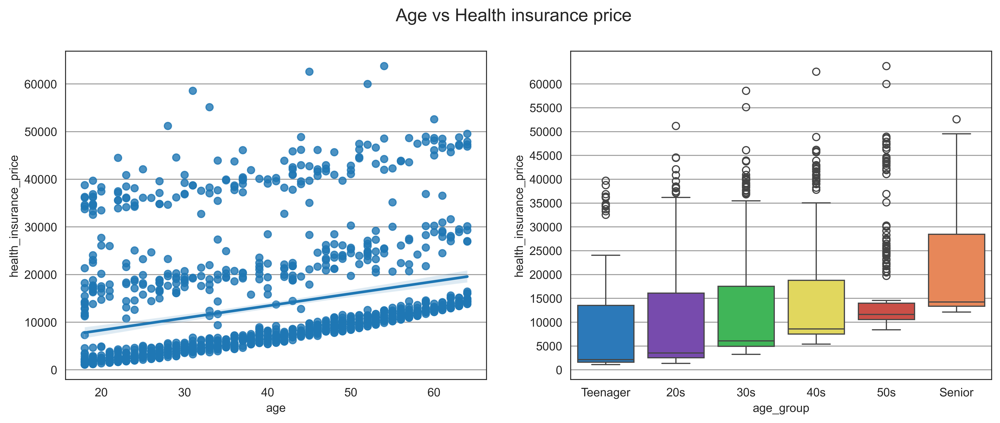

In [28]:
colors=['#147bd1','#753bbd','#2dc84d','#f7ea48','#ff7f41','#e03c31']
fig,ax=plt.subplots(1,2,figsize=(14,5),dpi=500)
sns.regplot(y=data['health_insurance_price'],x=data['age'],ax=ax[0])
sns.boxplot(x=data['age_group'],y=data['health_insurance_price'],hue=data['age_group'],ax=ax[1],order=['Teenager','20s','30s','40s','50s','Senior'],palette=colors)
fig.suptitle('Age vs Health insurance price',fontsize=15)
plt.subplots_adjust(wspace=0.2)
ax[1].set_yticks(range(0,62000,5000))
ax[0].grid(axis='y',color='black',alpha=0.4)
ax[1].grid(axis='y',color='black',alpha=0.4)
plt.show()

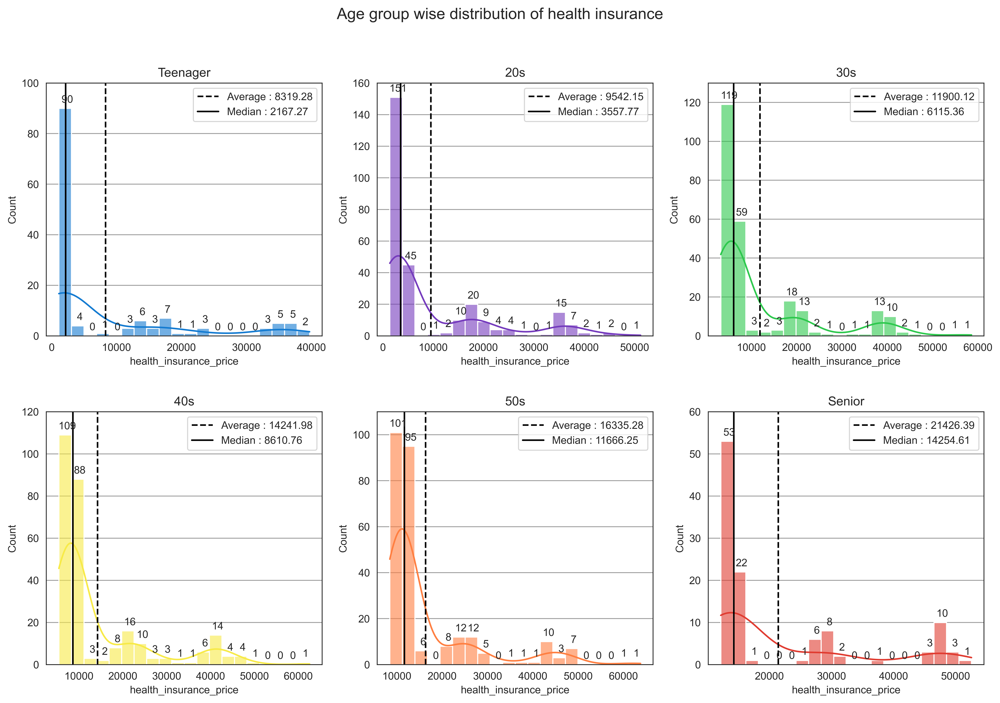

In [29]:
colors=['#147bd1','#753bbd','#2dc84d','#f7ea48','#ff7f41','#e03c31']
fig,ax=plt.subplots(2,3,figsize=(16,10),dpi=500)

p1=sns.histplot(data[data['age_group']=='Teenager']['health_insurance_price'],ax=ax[0,0],bins=20,color='#147bd1',kde=True,alpha=0.6)
ax[0,0].axvline(data[data['age_group']=='Teenager']['health_insurance_price'].mean(),label=('Average : {}'.format(round(data[data['age_group']=='Teenager']['health_insurance_price'].mean(),2))),linestyle='--',color='black')
ax[0,0].axvline(data[data['age_group']=='Teenager']['health_insurance_price'].median(),label=('Median : {}'.format(round(data[data['age_group']=='Teenager']['health_insurance_price'].median(),2))),linestyle='-',color='black')
ax[0,0].set_title('Teenager')
ax[0,0].set_ylim(0,100)
ax[0,0].grid(axis='y',color='black',alpha=0.4)
ax[0,0].legend()

p2=sns.histplot(data[data['age_group']=='20s']['health_insurance_price'],ax=ax[0,1],bins=20,color='#753bbd',kde=True,alpha=0.6)
ax[0,1].axvline(data[data['age_group']=='20s']['health_insurance_price'].mean(),label=('Average : {}'.format(round(data[data['age_group']=='20s']['health_insurance_price'].mean(),2))),linestyle='--',color='black')
ax[0,1].axvline(data[data['age_group']=='20s']['health_insurance_price'].median(),label=('Median : {}'.format(round(data[data['age_group']=='20s']['health_insurance_price'].median(),2))),linestyle='-',color='black')
ax[0,1].set_title('20s')
ax[0,1].set_ylim(0,160)
ax[0,1].grid(axis='y',color='black',alpha=0.4)
ax[0,1].legend()

p3=sns.histplot(data[data['age_group']=='30s']['health_insurance_price'],ax=ax[0,2],bins=20,color='#2dc84d',kde=True,alpha=0.6)
ax[0,2].axvline(data[data['age_group']=='30s']['health_insurance_price'].mean(),label=('Average : {}'.format(round(data[data['age_group']=='30s']['health_insurance_price'].mean(),2))),linestyle='--',color='black')
ax[0,2].axvline(data[data['age_group']=='30s']['health_insurance_price'].median(),label=('Median : {}'.format(round(data[data['age_group']=='30s']['health_insurance_price'].median(),2))),linestyle='-',color='black')
ax[0,2].set_title('30s')
ax[0,2].set_ylim(0,130)
ax[0,2].grid(axis='y',color='black',alpha=0.4)
ax[0,2].legend()

p4=sns.histplot(data[data['age_group']=='40s']['health_insurance_price'],ax=ax[1,0],bins=20,color='#f7ea48',kde=True,alpha=0.6)
ax[1,0].axvline(data[data['age_group']=='40s']['health_insurance_price'].mean(),label=('Average : {}'.format(round(data[data['age_group']=='40s']['health_insurance_price'].mean(),2))),linestyle='--',color='black')
ax[1,0].axvline(data[data['age_group']=='40s']['health_insurance_price'].median(),label=('Median : {}'.format(round(data[data['age_group']=='40s']['health_insurance_price'].median(),2))),linestyle='-',color='black')
ax[1,0].set_title('40s')
ax[1,0].set_ylim(0,120)
ax[1,0].grid(axis='y',color='black',alpha=0.4)
ax[1,0].legend()

p5=sns.histplot(data[data['age_group']=='50s']['health_insurance_price'],ax=ax[1,1],bins=20,color='#ff7f41',kde=True,alpha=0.6)
ax[1,1].axvline(data[data['age_group']=='50s']['health_insurance_price'].mean(),label=('Average : {}'.format(round(data[data['age_group']=='50s']['health_insurance_price'].mean(),2))),linestyle='--',color='black')
ax[1,1].axvline(data[data['age_group']=='50s']['health_insurance_price'].median(),label=('Median : {}'.format(round(data[data['age_group']=='50s']['health_insurance_price'].median(),2))),linestyle='-',color='black')
ax[1,1].set_title('50s')
ax[1,1].set_ylim(0,110)
ax[1,1].grid(axis='y',color='black',alpha=0.4)
ax[1,1].legend()

p6=sns.histplot(data[data['age_group']=='Senior']['health_insurance_price'],ax=ax[1,2],bins=20,color='#e03c31',kde=True,alpha=0.6)
ax[1,2].axvline(data[data['age_group']=='Senior']['health_insurance_price'].mean(),label=('Average : {}'.format(round(data[data['age_group']=='Senior']['health_insurance_price'].mean(),2))),linestyle='--',color='black')
ax[1,2].axvline(data[data['age_group']=='Senior']['health_insurance_price'].median(),label=('Median : {}'.format(round(data[data['age_group']=='Senior']['health_insurance_price'].median(),2))),linestyle='-',color='black')
ax[1,2].set_title('Senior')
ax[1,2].set_ylim(0,60)
ax[1,2].grid(axis='y',color='black',alpha=0.4)
ax[1,2].legend()

for plot in [p1,p2,p3,p4,p5,p6]:
    for p in plot.patches:
        plot.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),ha='center', va='center', xytext=(2, 8), textcoords='offset points')
plt.subplots_adjust(wspace=0.2,hspace=0.3)
fig.suptitle('Age group wise distribution of health insurance',fontsize=15)
plt.show()

In [30]:
data['health_insurance_price'].corr(data['age'])

0.2973885425425281

#### Initially we are assuming that there is no correlation between age and insurance price and checking the p-value using spearman correlation coefficient because the data is not normally distributed.

In [31]:
from scipy.stats import spearmanr

correlation, p_value = spearmanr(data['age'], data['health_insurance_price'])

print("Correlation coefficient:", correlation)
print("p-value:", p_value)

Correlation coefficient: 0.5330519292211093
p-value: 5.553289464925246e-97


#### Now we will compare age group wise

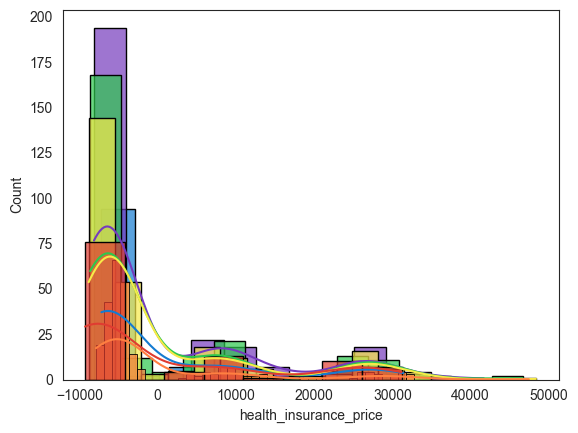

In [113]:
m1=data[data['age_group']=='Teenager']['health_insurance_price']-data[data['age_group']=='Teenager']['health_insurance_price'].mean()
m2=data[data['age_group']=='20s']['health_insurance_price']-data[data['age_group']=='20s']['health_insurance_price'].mean()
m3=data[data['age_group']=='30s']['health_insurance_price']-data[data['age_group']=='30s']['health_insurance_price'].mean()
m4=data[data['age_group']=='40s']['health_insurance_price']-data[data['age_group']=='40s']['health_insurance_price'].mean()
m5=data[data['age_group']=='50s']['health_insurance_price']-data[data['age_group']=='50s']['health_insurance_price'].mean()
m6=data[data['age_group']=='Senior']['health_insurance_price']-data[data['age_group']=='Senior']['health_insurance_price'].mean()

sns.histplot(m1,color='#147bd1',edgecolor='black',alpha=0.7,kde=True)
sns.histplot(m2,color='#753bbd',edgecolor='black',alpha=0.7,kde=True)
sns.histplot(m3,color='#2dc84d',edgecolor='black',alpha=0.7,kde=True)
sns.histplot(m4,color='#f7ea48',edgecolor='black',alpha=0.7,kde=True)
sns.histplot(m5,color='#ff7f41',edgecolor='black',alpha=0.7,kde=True)
sns.histplot(m6,color='#e03c31',edgecolor='black',alpha=0.7,kde=True)
plt.show()

In [74]:
test1=[m1,m2,m3,m4,m5,m6]
count=1
for i in test1:
    stat,p_value=stats.shapiro(i)
    print(f'm{count}: {p_value}')
    count+=1

m1: 2.6314584636914177e-16
m2: 2.0843021567017765e-22
m3: 8.454031227587903e-22
m4: 1.6228267313008989e-22
m5: 2.9727276580167565e-23
m6: 4.8238794008543737e-14


#### Above health insurance price data for age group wise is not normally distributed we can see by the visualization and shapiro wilk test of normality so we cannot use ANOVA.

In [77]:
age1=data[data['age_group']=='Teenager']['health_insurance_price']
age2=data[data['age_group']=='20s']['health_insurance_price']
age3=data[data['age_group']=='30s']['health_insurance_price']
age4=data[data['age_group']=='40s']['health_insurance_price']
age5=data[data['age_group']=='50s']['health_insurance_price']
age6=data[data['age_group']=='Senior']['health_insurance_price']

k_stat,p_value=stats.kruskal(age1,age2,age3,age4,age5,age6)
print(p_value)

8.433505297984883e-76


#### We have observed that we are having a positive correlation between age and health insurance price, although by looking at the pearson correlation coefficient we are observing that in this portion of data we are having a weak positive correlation. But after spearman correlation coefficient test we are getting p-value less than 0.05 and very much close to 0 which is carrying a strong evidence against the null hypothesis of having no correlation. We have also performed kruskal wallis h test between different age groups and there also we are getting p value less than 0.05 (very close to 0). So primarily we can infer that there is a significant correlation between age and health insurance price in the population. We have observed that based on the age group the values of the health insurance price is increasing, teenagers are having the lowest price with respect to other age groups and senior citizens are having highest price of health insurance.Although we observing some extreme values (outliers) which opposes the trend of the distribution in all of the age groups. From the separate distributions we have seen that for teenagers we have median price is 2167.27, for 20s median price 3557.77, for 30s median price 6115.36, for 40s median price 8610.76, for 50s median price 11666.25, for senior policyholders the median price is 14254.61. So we are observing a positive linear relationship between age and insurance price. And because the distributions are right skewed we are prefering median over average. We have least numbers of extreme values for the senior age groups and most extreme values are form 50s age groups.

#### **BMI with health insurance price**

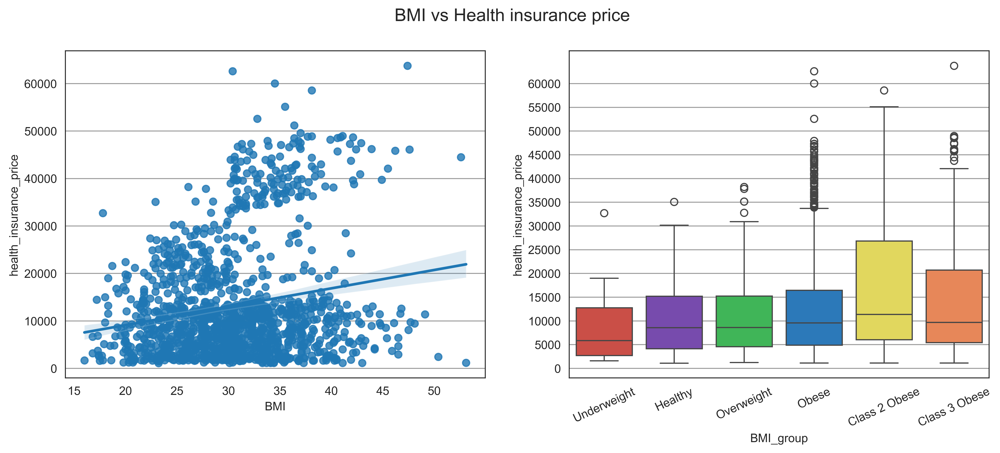

In [32]:
colors=['#147bd1','#753bbd','#2dc84d','#f7ea48','#ff7f41','#e03c31']
fig,ax=plt.subplots(1,2,figsize=(14,5),dpi=500)
sns.regplot(y=data['health_insurance_price'],x=data['BMI'],ax=ax[0])
sns.boxplot(x=data['BMI_group'],y=data['health_insurance_price'],hue=data['BMI_group'],ax=ax[1],order=['Underweight','Healthy','Overweight','Obese','Class 2 Obese','Class 3 Obese'],palette=colors)
fig.suptitle('BMI vs Health insurance price',fontsize=15)
plt.subplots_adjust(wspace=0.2)
plt.xticks(rotation=25)
ax[1].set_yticks(range(0,62000,5000))
ax[0].grid(axis='y',color='black',alpha=0.4)
ax[1].grid(axis='y',color='black',alpha=0.4)
plt.show()

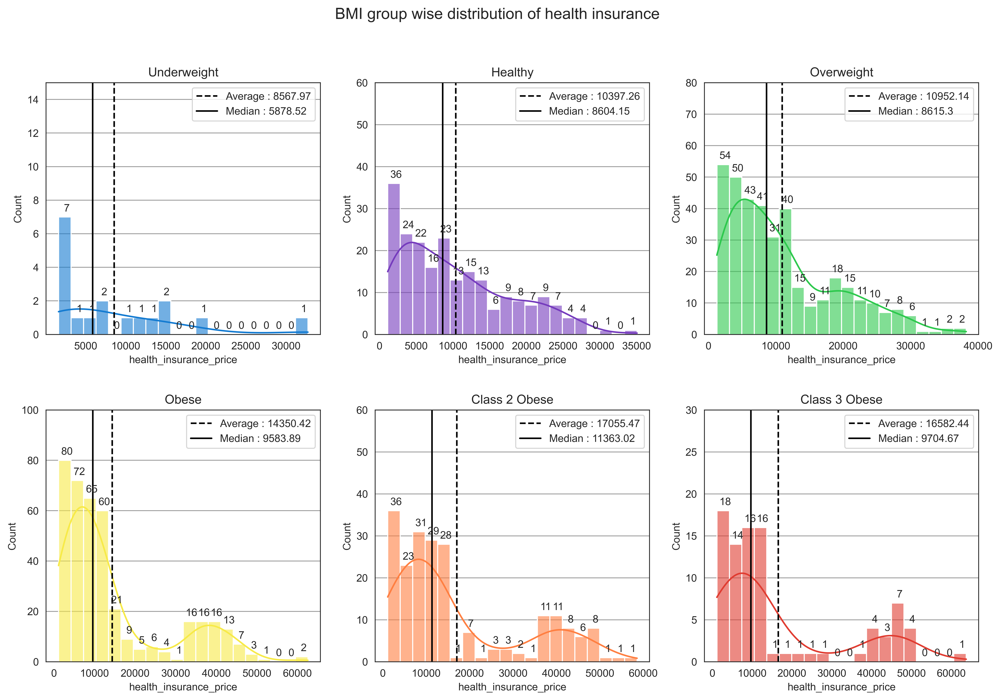

In [33]:
colors=['#147bd1','#753bbd','#2dc84d','#f7ea48','#ff7f41','#e03c31']
fig,ax=plt.subplots(2,3,figsize=(16,10),dpi=500)

p1=sns.histplot(data[data['BMI_group']=='Underweight']['health_insurance_price'],ax=ax[0,0],bins=20,color='#147bd1',kde=True,alpha=0.6)
ax[0,0].axvline(data[data['BMI_group']=='Underweight']['health_insurance_price'].mean(),label=('Average : {}'.format(round(data[data['BMI_group']=='Underweight']['health_insurance_price'].mean(),2))),linestyle='--',color='black')
ax[0,0].axvline(data[data['BMI_group']=='Underweight']['health_insurance_price'].median(),label=('Median : {}'.format(round(data[data['BMI_group']=='Underweight']['health_insurance_price'].median(),2))),linestyle='-',color='black')
ax[0,0].set_title('Underweight')
ax[0,0].set_ylim(0,15)
ax[0,0].grid(axis='y',color='black',alpha=0.4)
ax[0,0].legend()

p2=sns.histplot(data[data['BMI_group']=='Healthy']['health_insurance_price'],ax=ax[0,1],bins=20,color='#753bbd',kde=True,alpha=0.6)
ax[0,1].axvline(data[data['BMI_group']=='Healthy']['health_insurance_price'].mean(),label=('Average : {}'.format(round(data[data['BMI_group']=='Healthy']['health_insurance_price'].mean(),2))),linestyle='--',color='black')
ax[0,1].axvline(data[data['BMI_group']=='Healthy']['health_insurance_price'].median(),label=('Median : {}'.format(round(data[data['BMI_group']=='Healthy']['health_insurance_price'].median(),2))),linestyle='-',color='black')
ax[0,1].set_title('Healthy')
ax[0,1].set_ylim(0,60)
ax[0,1].grid(axis='y',color='black',alpha=0.4)
ax[0,1].legend()

p3=sns.histplot(data[data['BMI_group']=='Overweight']['health_insurance_price'],ax=ax[0,2],bins=20,color='#2dc84d',kde=True,alpha=0.6)
ax[0,2].axvline(data[data['BMI_group']=='Overweight']['health_insurance_price'].mean(),label=('Average : {}'.format(round(data[data['BMI_group']=='Overweight']['health_insurance_price'].mean(),2))),linestyle='--',color='black')
ax[0,2].axvline(data[data['BMI_group']=='Overweight']['health_insurance_price'].median(),label=('Median : {}'.format(round(data[data['BMI_group']=='Overweight']['health_insurance_price'].median(),2))),linestyle='-',color='black')
ax[0,2].set_title('Overweight')
ax[0,2].set_ylim(0,80)
ax[0,2].grid(axis='y',color='black',alpha=0.4)
ax[0,2].legend()

p4=sns.histplot(data[data['BMI_group']=='Obese']['health_insurance_price'],ax=ax[1,0],bins=20,color='#f7ea48',kde=True,alpha=0.6)
ax[1,0].axvline(data[data['BMI_group']=='Obese']['health_insurance_price'].mean(),label=('Average : {}'.format(round(data[data['BMI_group']=='Obese']['health_insurance_price'].mean(),2))),linestyle='--',color='black')
ax[1,0].axvline(data[data['BMI_group']=='Obese']['health_insurance_price'].median(),label=('Median : {}'.format(round(data[data['BMI_group']=='Obese']['health_insurance_price'].median(),2))),linestyle='-',color='black')
ax[1,0].set_title('Obese')
ax[1,0].set_ylim(0,100)
ax[1,0].grid(axis='y',color='black',alpha=0.4)
ax[1,0].legend()

p5=sns.histplot(data[data['BMI_group']=='Class 2 Obese']['health_insurance_price'],ax=ax[1,1],bins=20,color='#ff7f41',kde=True,alpha=0.6)
ax[1,1].axvline(data[data['BMI_group']=='Class 2 Obese']['health_insurance_price'].mean(),label=('Average : {}'.format(round(data[data['BMI_group']=='Class 2 Obese']['health_insurance_price'].mean(),2))),linestyle='--',color='black')
ax[1,1].axvline(data[data['BMI_group']=='Class 2 Obese']['health_insurance_price'].median(),label=('Median : {}'.format(round(data[data['BMI_group']=='Class 2 Obese']['health_insurance_price'].median(),2))),linestyle='-',color='black')
ax[1,1].set_title('Class 2 Obese')
ax[1,1].set_ylim(0,60)
ax[1,1].grid(axis='y',color='black',alpha=0.4)
ax[1,1].legend()

p6=sns.histplot(data[data['BMI_group']=='Class 3 Obese']['health_insurance_price'],ax=ax[1,2],bins=20,color='#e03c31',kde=True,alpha=0.6)
ax[1,2].axvline(data[data['BMI_group']=='Class 3 Obese']['health_insurance_price'].mean(),label=('Average : {}'.format(round(data[data['BMI_group']=='Class 3 Obese']['health_insurance_price'].mean(),2))),linestyle='--',color='black')
ax[1,2].axvline(data[data['BMI_group']=='Class 3 Obese']['health_insurance_price'].median(),label=('Median : {}'.format(round(data[data['BMI_group']=='Class 3 Obese']['health_insurance_price'].median(),2))),linestyle='-',color='black')
ax[1,2].set_title('Class 3 Obese')
ax[1,2].set_ylim(0,30)
ax[1,2].grid(axis='y',color='black',alpha=0.4)
ax[1,2].legend()

for plot in [p1,p2,p3,p4,p5,p6]:
    for p in plot.patches:
        plot.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),ha='center', va='center', xytext=(2, 8), textcoords='offset points')
plt.subplots_adjust(wspace=0.2,hspace=0.3)
fig.suptitle('BMI group wise distribution of health insurance',fontsize=15)
plt.show()

In [34]:
data['health_insurance_price'].corr(data['BMI'])

0.19399234708884172

#### Initially we are assuming that there is no correlation between BMI and insurance price and checking the p-value using spearman correlation coefficient because the data is not normally distributed

In [35]:
correlation, p_value = spearmanr(data['BMI'], data['health_insurance_price'])

print("Correlation coefficient:", correlation)
print("p-value:", p_value)

Correlation coefficient: 0.11810732963321696
p-value: 1.8351718566065378e-05


#### Now we are checking BMI group wise

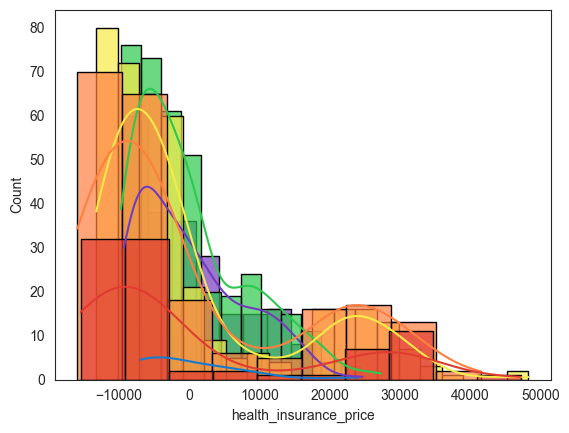

In [112]:
b1=data[data['BMI_group']=='Underweight']['health_insurance_price']-data[data['BMI_group']=='Underweight']['health_insurance_price'].mean()
b2=data[data['BMI_group']=='Healthy']['health_insurance_price']-data[data['BMI_group']=='Healthy']['health_insurance_price'].mean()
b3=data[data['BMI_group']=='Overweight']['health_insurance_price']-data[data['BMI_group']=='Overweight']['health_insurance_price'].mean()
b4=data[data['BMI_group']=='Obese']['health_insurance_price']-data[data['BMI_group']=='Obese']['health_insurance_price'].mean()
b5=data[data['BMI_group']=='Class 2 Obese']['health_insurance_price']-data[data['BMI_group']=='Class 2 Obese']['health_insurance_price'].mean()
b6=data[data['BMI_group']=='Class 3 Obese']['health_insurance_price']-data[data['BMI_group']=='Class 3 Obese']['health_insurance_price'].mean()

sns.histplot(b1,color='#147bd1',kde=True,edgecolor='black',alpha=0.7)
sns.histplot(b2,color='#753bbd',kde=True,edgecolor='black',alpha=0.7)
sns.histplot(b3,color='#2dc84d',kde=True,edgecolor='black',alpha=0.7)
sns.histplot(b4,color='#f7ea48',kde=True,edgecolor='black',alpha=0.7)
sns.histplot(b5,color='#ff7f41',kde=True,edgecolor='black',alpha=0.7)
sns.histplot(b6,color='#e03c31',kde=True,edgecolor='black',alpha=0.7)
plt.show()

In [79]:
test1=[b1,b2,b3,b4,b5,b6]
count=1
for i in test1:
    stat,p_value=stats.shapiro(i)
    print(f'b{count}: {p_value}')
    count+=1

b1: 0.0020359172485768795
b2: 1.0402523287211807e-09
b3: 3.5343618629652893e-15
b4: 5.569793694515515e-22
b5: 1.1052309512472186e-14
b6: 1.1297662111386941e-10


#### Above health insurance price data for BMI group wise is not normally distributed we can see by the visualization and shapiro wilk test of normality so we cannot use ANOVA.

In [80]:
bmi1=data[data['BMI_group']=='Underweight']['health_insurance_price']
bmi2=data[data['BMI_group']=='Healthy']['health_insurance_price']
bmi3=data[data['BMI_group']=='Overweight']['health_insurance_price']
bmi4=data[data['BMI_group']=='Obese']['health_insurance_price']
bmi5=data[data['BMI_group']=='Class 2 Obese']['health_insurance_price']
bmi6=data[data['BMI_group']=='Class 3 Obese']['health_insurance_price']

k_stat,p_value=stats.kruskal(bmi1,bmi2,bmi3,bmi4,bmi5,bmi6)
print(p_value)

0.0003805463006350427


#### We have observed that we are having a positive correlation between BMI and health insurance price, although by looking at the pearson correlation coefficient we are observing that in this portion of data we are having a weak positive correlation. But after spearman correlation coefficient test we are getting p-value less than 0.05 and very much close to 0 which is carrying a strong evidence against the null hypothesis of having no correlation. We have also performed kruskal wallis h test between different BMI groups and there also we are getting p value less than 0.05 (very close to 0). So primarily we can infer that in this sample we might not have a strong correlation but there is a significant correlation between BMI and health insurance price in the population. We have observed that based on the BMI level the values of the health insurance price is increasing. Underweight are having the lowest price with respect to other BMI groups and Class 2 Obese group are having highest price of health insurance.Although we observing some extreme values (outliers) which opposes the trend of the distribution in all of the BMI level. From the separate distributions we have seen that for underweight we have median price is 5878.52, for healthy the median price 8604.15, for overweight the median price 8615.3, for Obese median price 9583.89, for class 2 obese median price 11363.02, for class 3 obese the median price is 9704.67. So we are observing a positive linear relationship between BMI and insurance price. And because the distributions are right skewed we are prefering median over average. We have least numbers of extreme values for the class 2 obese BMI groups and most extreme values are form obese BMI groups. We have observed that there is not much difference in median health insurance price between healthy, overweight, obese and class 3 obese bmi groups. We have also observed that in all of the distributions most number of people are having insurance value under 10000 to 15000.

#### **Gender vs Health Insurance price**

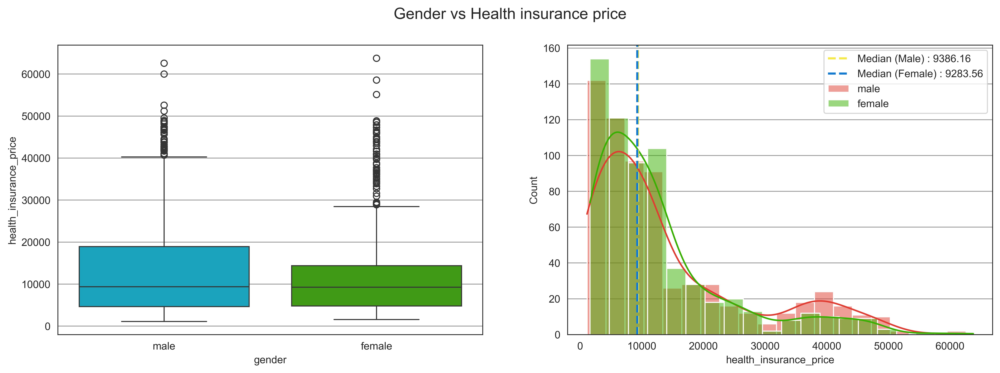

In [36]:
fig,ax=plt.subplots(1,2,figsize=(16,5),dpi=500)
sns.boxplot(y=data['health_insurance_price'],x=data['gender'],hue=data['gender'],order=['male','female'],ax=ax[0],palette=['#38b000','#00b4d8'])
sns.histplot(data[data['gender']=='male']['health_insurance_price'],ax=ax[1],color='#e03c31',kde=True,bins=20,label='male')
sns.histplot(data[data['gender']=='female']['health_insurance_price'],ax=ax[1],color='#38b000',kde=True,bins=20,label='female')
ax[1].axvline(data[data['gender']=='male']['health_insurance_price'].median(),label=('Median (Male) : {}'.format(round(data[data['gender']=='male']['health_insurance_price'].median(),2))),linestyle='--',linewidth=2,color='#f7ea48')
ax[1].axvline(data[data['gender']=='female']['health_insurance_price'].median(),label=('Median (Female) : {}'.format(round(data[data['gender']=='female']['health_insurance_price'].median(),2))),linestyle='--',linewidth=2,color='#147bd1')
ax[0].grid(axis='y',color='black',alpha=0.4)
ax[1].grid(axis='y',color='black',alpha=0.4)
fig.suptitle('Gender vs Health insurance price',fontsize=15)
plt.legend()
plt.show()

#### From the above plots we have observed that median health insurance price is almost same (Because of the right skewed distribution we are taking median only). Though male tends to have more variation and overall values is higher in terms of health insurance price and upper limit is relatively low than the male in female. We have more numbers of outliers that means getting insurance prices that are higher than the normal trend is greater in female than male. We have observed more females are getting health insurance price under 10000-15000 while the number of males getting the high value insurance plan is greater than female. We are observing more number of males getting insurance values within the 30000-50000. Within 20000-30000 insurance value the distribution is similar almost.

In [37]:
from scipy import stats

male_insurance=(data[data['gender']=='male']['health_insurance_price'])
female_insurance=(data[data['gender']=='female']['health_insurance_price'])

u_stat,p_value=stats.mannwhitneyu(male_insurance,female_insurance)
print(p_value)

0.5854703919722121


#### We have performed Mann Whitney U test to check if there is significant difference between the health insurance price for male and female, our initial hypothesis was that there is no difference between male and female in terms of health insurance prices and by the p_value(0.06 approx) we are getting we can conclude that we failed to reject the null hypothesis and can say that there is no such statistically significant difference between male and female for health insurance price. We are using Mann Whitney U test because the distribution of health insurance price in heavily skewed so it is violating the asumptions for t-test.

#### **Smoking status vs Health insurance price**

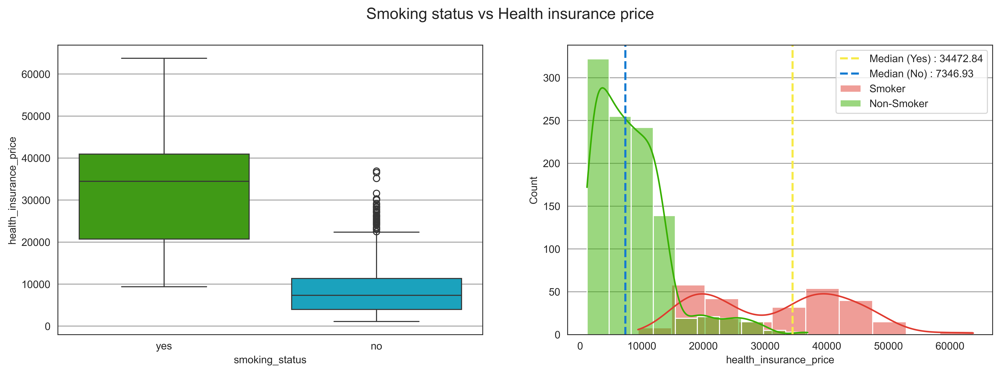

In [38]:
fig,ax=plt.subplots(1,2,figsize=(16,5),dpi=500)
sns.boxplot(y=data['health_insurance_price'],x=data['smoking_status'],hue=data['smoking_status'],order=['yes','no'],ax=ax[0],palette=['#38b000','#00b4d8'])
sns.histplot(data[data['smoking_status']=='yes']['health_insurance_price'],ax=ax[1],color='#e03c31',kde=True,bins=10,label='Smoker')
sns.histplot(data[data['smoking_status']=='no']['health_insurance_price'],ax=ax[1],color='#38b000',kde=True,bins=10,label='Non-Smoker')
ax[1].axvline(data[data['smoking_status']=='yes']['health_insurance_price'].median(),label=('Median (Yes) : {}'.format(round(data[data['smoking_status']=='yes']['health_insurance_price'].median(),2))),linestyle='--',linewidth=2,color='#f7ea48')
ax[1].axvline(data[data['smoking_status']=='no']['health_insurance_price'].median(),label=('Median (No) : {}'.format(round(data[data['smoking_status']=='no']['health_insurance_price'].median(),2))),linestyle='--',linewidth=2,color='#147bd1')
ax[0].grid(axis='y',color='black',alpha=0.4)
ax[1].grid(axis='y',color='black',alpha=0.4)
fig.suptitle('Smoking status vs Health insurance price',fontsize=15)
plt.legend()
plt.show()

#### By looking at the plots we can say that there is a significant difference between the insurance prices of smokers and non-smokers. The minimum insurance prices of smokers are significantly greater than non-smmoker (even greater than the median price of the insurance for non-smokers.).The maximum price of the insurance of non-smokers are close to 20000 although we have some extreme and uncommon values as well. But for smokers the max values is going beyond 60000 starting from slightly under 10000. The median insurance price value for smokers is 34473 approx whereas for the non-smokers are only 7347 approx. We have checked the distribution and observed that most non smoker policyholders are getting under 10000-15000. Whereas the smoker policyholders are getting values mostly 20000-50000.

In [39]:
from scipy import stats

smoker_insurance=data[data['smoking_status']=='yes']['health_insurance_price']
nonsmoker_insurance=data[data['smoking_status']=='no']['health_insurance_price']

u_stat,p_value=stats.mannwhitneyu(smoker_insurance,nonsmoker_insurance)
print(p_value)

2.5021322834876947e-127


#### We have performed Mann Whitney U test to check if there is significant difference between the health insurance price for smokers and non-smokers, our initial hypothesis was that there is no difference between smokers and non-smokers in terms of health insurance prices and by the p_value which is almost 0 indicates that we can reject the null hypothesis and can say that there is statistically significant difference in health insurance price between smokers and non-smokers. We are using Mann Whitney U test because the distribution of health insurance price in heavily skewed for smokers and non-smokers so t test will not perform well.

#### **Location vs Health Insurance price**

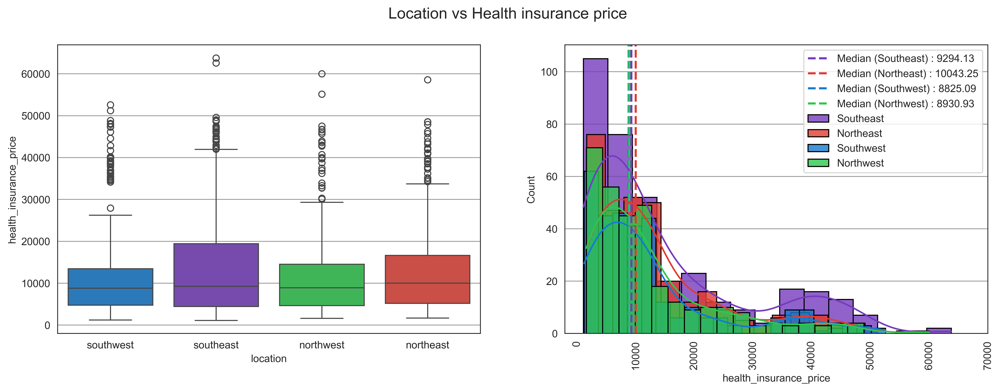

In [109]:
fig,ax=plt.subplots(1,2,figsize=(16,5),dpi=500)
sns.boxplot(y=data['health_insurance_price'],x=data['location'],hue=data['location'],ax=ax[0],palette=['#147bd1','#753bbd','#2dc84d','#e03c31'])
sns.histplot(data[data['location']=='southeast']['health_insurance_price'],ax=ax[1],color='#753bbd',label='Southeast',kde=True,alpha=0.8,edgecolor='black')
sns.histplot(data[data['location']=='northeast']['health_insurance_price'],ax=ax[1],color='#e03c31',label='Northeast',kde=True,alpha=0.8,edgecolor='black')
sns.histplot(data[data['location']=='southwest']['health_insurance_price'],ax=ax[1],color='#147bd1',label='Southwest',kde=True,alpha=0.8,edgecolor='black')
sns.histplot(data[data['location']=='northwest']['health_insurance_price'],ax=ax[1],color='#2dc84d',label='Northwest',kde=True,alpha=0.8,edgecolor='black')
ax[1].axvline(data[data['location']=='southeast']['health_insurance_price'].median(),label=('Median (Southeast) : {}'.format(round(data[data['location']=='southeast']['health_insurance_price'].median(),2))),linestyle='--',linewidth=2,color='#753bbd')
ax[1].axvline(data[data['location']=='northeast']['health_insurance_price'].median(),label=('Median (Northeast) : {}'.format(round(data[data['location']=='northeast']['health_insurance_price'].median(),2))),linestyle='--',linewidth=2,color='#e03c31')
ax[1].axvline(data[data['location']=='southwest']['health_insurance_price'].median(),label=('Median (Southwest) : {}'.format(round(data[data['location']=='southwest']['health_insurance_price'].median(),2))),linestyle='--',linewidth=2,color='#147bd1')
ax[1].axvline(data[data['location']=='northwest']['health_insurance_price'].median(),label=('Median (Northwest) : {}'.format(round(data[data['location']=='northwest']['health_insurance_price'].median(),2))),linestyle='--',linewidth=2,color='#2dc84d')
ax[0].grid(axis='y',color='black',alpha=0.4)
ax[1].grid(axis='y',color='black',alpha=0.4)
ax[1].set_xticks(range(0,80000,10000))
ax[1].tick_params(axis='x',rotation=90)
fig.suptitle('Location vs Health insurance price',fontsize=15)
plt.legend()
plt.show()

#### We have observed from the plot that in terms of median health insurance price we are not having much of a difference for different locations. Median values from all of the location are very much close to 10000 but very minor difference is there but the most prominent among them is the southeast although the median is almost similar but the upper limit is greater than others. In the distribution we can see the peak value is lower between the range of 0-20000 but the peak is higher in between 30000-50000. For the rest of the locations the distribution is almost same.

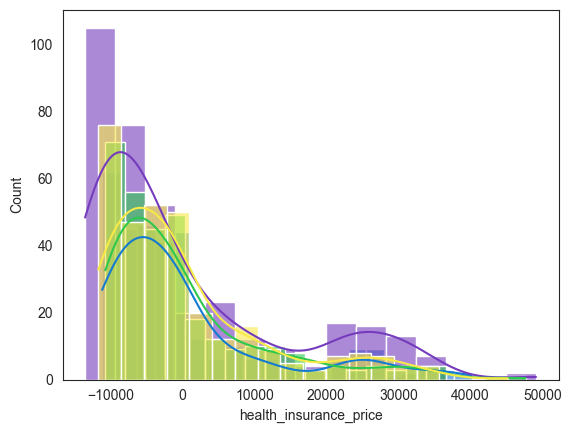

In [103]:
l1=data[data['location']=='southwest']['health_insurance_price']-data[data['location']=='southwest']['health_insurance_price'].mean()
l2=data[data['location']=='southeast']['health_insurance_price']-data[data['location']=='southeast']['health_insurance_price'].mean()
l3=data[data['location']=='northwest']['health_insurance_price']-data[data['location']=='northwest']['health_insurance_price'].mean()
l4=data[data['location']=='northeast']['health_insurance_price']-data[data['location']=='northeast']['health_insurance_price'].mean()

sns.histplot(l1,color='#147bd1',kde=True,alpha=0.6)
sns.histplot(l2,color='#753bbd',kde=True,alpha=0.6)
sns.histplot(l3,color='#2dc84d',kde=True,alpha=0.6)
sns.histplot(l4,color='#f7ea48',kde=True,alpha=0.6)
plt.show()

In [82]:
test1=[l1,l2,l3,l4]
count=1
for i in test1:
    stat,p_value=stats.shapiro(i)
    print(f'l{count}: {p_value}')
    count+=1

l1: 3.631870573146181e-20
l2: 1.8251645865693936e-19
l3: 4.727776123453089e-19
l4: 6.564913141262816e-18


#### Above health insurance price data for location wise is not normally distributed we can see by the visualization and shapiro wilk test of normality so we cannot use ANOVA.

In [41]:
from scipy import stats

southeast_price=data[data['location']=='southeast']['health_insurance_price']
northeast_price=data[data['location']=='northeast']['health_insurance_price']
southwest_price=data[data['location']=='southwest']['health_insurance_price']
northwest_price=data[data['location']=='northwest']['health_insurance_price']

k_stat,p_value=stats.kruskal(southeast_price,northeast_price,southwest_price,northwest_price)
print(p_value)

0.21200949500140187


#### We have performed Kruskal Wallis H test to check the significant difference between different locations because our distribution is right skewed so we didn't use ANOVA. Our initial hypothesis was there is no difference in price of the health insurance based on location and we are having p_value which is greater than 0.05 that means we failed to reject null hypothesis and can infer that we don't have statistically significant difference in the insurance price between different locations.

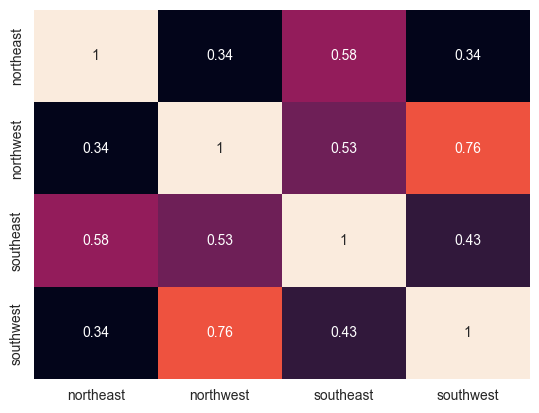

In [42]:
from scikit_posthocs import posthoc_dunn

dunn_results = posthoc_dunn(data,val_col='health_insurance_price', group_col='location', p_adjust='fdr_bh')
plt.figure(dpi=100)
sns.heatmap(dunn_results,annot=True,cbar=False)
plt.show()

#### We have performed Dunn Post hoc test to cross verify and here after comparing p values for each group we can say that there is no significant difference in price of health insurance price between different location as the p values are more than 0.05.

#### **Children vs Health Insurance price**

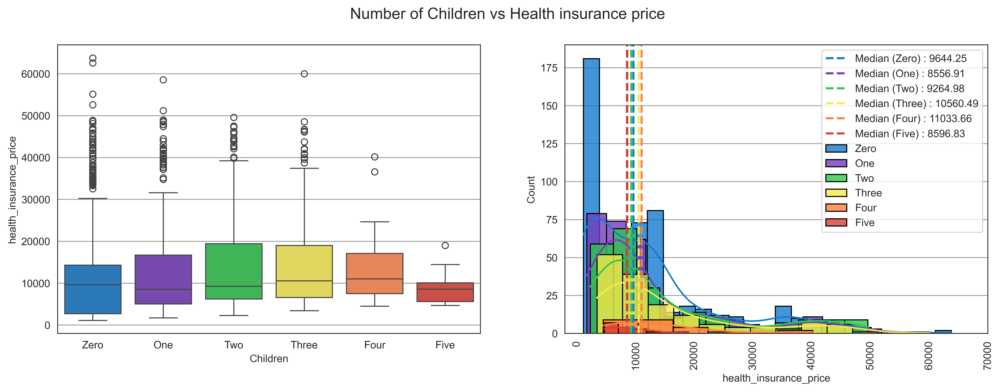

In [108]:
fig,ax=plt.subplots(1,2,figsize=(16,5),dpi=500)
sns.boxplot(y=data['health_insurance_price'],x=data['Children'],ax=ax[0],palette=['#147bd1','#753bbd','#2dc84d','#f7ea48','#ff7f41','#e03c31'],order=data['Children'].value_counts().index)
sns.histplot(data[data['Children']=='Zero']['health_insurance_price'],ax=ax[1],color='#147bd1',label='Zero',kde=True,alpha=0.8,edgecolor='black')
sns.histplot(data[data['Children']=='One']['health_insurance_price'],ax=ax[1],color='#753bbd',label='One',kde=True,alpha=0.8,edgecolor='black')
sns.histplot(data[data['Children']=='Two']['health_insurance_price'],ax=ax[1],color='#2dc84d',label='Two',kde=True,alpha=0.8,edgecolor='black')
sns.histplot(data[data['Children']=='Three']['health_insurance_price'],ax=ax[1],color='#f7ea48',label='Three',kde=True,alpha=0.8,edgecolor='black')
sns.histplot(data[data['Children']=='Four']['health_insurance_price'],ax=ax[1],color='#ff7f41',label='Four',kde=True,alpha=0.8,edgecolor='black')
sns.histplot(data[data['Children']=='Five']['health_insurance_price'],ax=ax[1],color='#e03c31',label='Five',kde=True,alpha=0.8,edgecolor='black')
ax[1].axvline(data[data['Children']=='Zero']['health_insurance_price'].median(),label=('Median (Zero) : {}'.format(round(data[data['Children']=='Zero']['health_insurance_price'].median(),2))),linestyle='--',linewidth=2,color='#147bd1')
ax[1].axvline(data[data['Children']=='One']['health_insurance_price'].median(),label=('Median (One) : {}'.format(round(data[data['Children']=='One']['health_insurance_price'].median(),2))),linestyle='--',linewidth=2,color='#753bbd')
ax[1].axvline(data[data['Children']=='Two']['health_insurance_price'].median(),label=('Median (Two) : {}'.format(round(data[data['Children']=='Two']['health_insurance_price'].median(),2))),linestyle='--',linewidth=2,color='#2dc84d')
ax[1].axvline(data[data['Children']=='Three']['health_insurance_price'].median(),label=('Median (Three) : {}'.format(round(data[data['Children']=='Three']['health_insurance_price'].median(),2))),linestyle='--',linewidth=2,color='#f7ea48')
ax[1].axvline(data[data['Children']=='Four']['health_insurance_price'].median(),label=('Median (Four) : {}'.format(round(data[data['Children']=='Four']['health_insurance_price'].median(),2))),linestyle='--',linewidth=2,color='#ff7f41')
ax[1].axvline(data[data['Children']=='Five']['health_insurance_price'].median(),label=('Median (Five) : {}'.format(round(data[data['Children']=='Five']['health_insurance_price'].median(),2))),linestyle='--',linewidth=2,color='#e03c31')
ax[0].grid(axis='y',color='black',alpha=0.4)
ax[1].grid(axis='y',color='black',alpha=0.4)
plt.xticks(range(0,80000,10000))
ax[1].tick_params(axis='x',rotation=90)
fig.suptitle('Number of Children vs Health insurance price',fontsize=15)
ax[1].legend()
plt.show()

#### From the above plots we have observed that the median insurance price of each group is very close to each other we can see that there are very minor difference in each group but from looking at the distributions but all of them are right skewed. But we have to cross verify it.

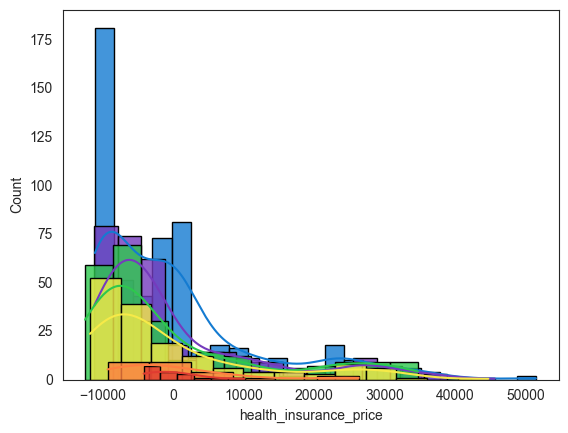

In [110]:
c1=data[data['Children']=='Zero']['health_insurance_price']-data[data['Children']=='Zero']['health_insurance_price'].mean()
c2=data[data['Children']=='One']['health_insurance_price']-data[data['Children']=='One']['health_insurance_price'].mean()
c3=data[data['Children']=='Two']['health_insurance_price']-data[data['Children']=='Two']['health_insurance_price'].mean()
c4=data[data['Children']=='Three']['health_insurance_price']-data[data['Children']=='Three']['health_insurance_price'].mean()
c5=data[data['Children']=='Four']['health_insurance_price']-data[data['Children']=='Four']['health_insurance_price'].mean()
c6=data[data['Children']=='Five']['health_insurance_price']-data[data['Children']=='Five']['health_insurance_price'].mean()

sns.histplot(c1,color='#147bd1',kde=True,alpha=0.8,edgecolor='black')
sns.histplot(c2,color='#753bbd',kde=True,alpha=0.8,edgecolor='black')
sns.histplot(c3,color='#2dc84d',kde=True,alpha=0.8,edgecolor='black')
sns.histplot(c4,color='#f7ea48',kde=True,alpha=0.8,edgecolor='black')
sns.histplot(c5,color='#ff7f41',kde=True,alpha=0.8,edgecolor='black')
sns.histplot(c6,color='#e03c31',kde=True,alpha=0.8,edgecolor='black')
plt.show()

In [85]:
test1=[c1,c2,c3,c4,c5,c6]
count=1
for i in test1:
    stat,p_value=stats.shapiro(i)
    print(f'c{count}: {p_value}')
    count+=1

c1: 5.710319546014286e-25
c2: 2.7591342808265025e-20
c3: 4.351148031296747e-17
c4: 2.8657569481511935e-13
c5: 0.0007348770159296691
c6: 0.06281005591154099


#### From the above visualization and shapiro wilk test weare observing that there is only one group that is satisfying the normality condition so we cannot use ANOVA.

In [44]:
from scipy import stats

zero=data[data['Children']=='Zero']['health_insurance_price']
one=data[data['Children']=='One']['health_insurance_price']
two=data[data['Children']=='Two']['health_insurance_price']
three=data[data['Children']=='Three']['health_insurance_price']
four=data[data['Children']=='Four']['health_insurance_price']
five=data[data['Children']=='Five']['health_insurance_price']

k_stat,p_value=stats.kruskal(zero,one,two,three,four,five)
print(p_value)

3.880038569424784e-05


#### We have performed Kruskal Wallis H test to check the significant difference between different number of children groups because our distribution is right skewed so we didn't use ANOVA. Our initial hypothesis was there is no difference in price of the health insurance based on these groups but we are having p_value which is less than 0.05 (very close to 0) that means there is enough evidence to reject null hypothesis and can infer that we have statistically significant difference in the insurance price between different number of children groups.

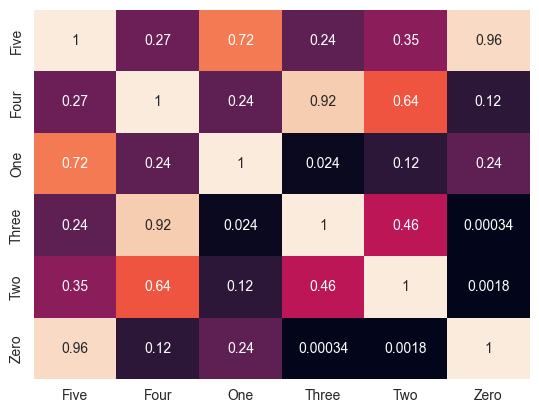

In [45]:
from scikit_posthocs import posthoc_dunn

dunn_results = posthoc_dunn(data,val_col='health_insurance_price', group_col='Children', p_adjust='fdr_bh')
sns.heatmap(dunn_results,annot=True,cbar=False)
plt.show()

#### We have performed Dunn Post hoc test to cross verify and here after comparing p values for each group we can say that we are observing significance difference in the health insurance price between the policyholders with 0 child and 1 child and between 0 child and 2 children. There is also indication of significant difference between the policyholders of 1 child and 3 children because the p value is less than 0.05.

#### **Age/Age group vs Smoking status**

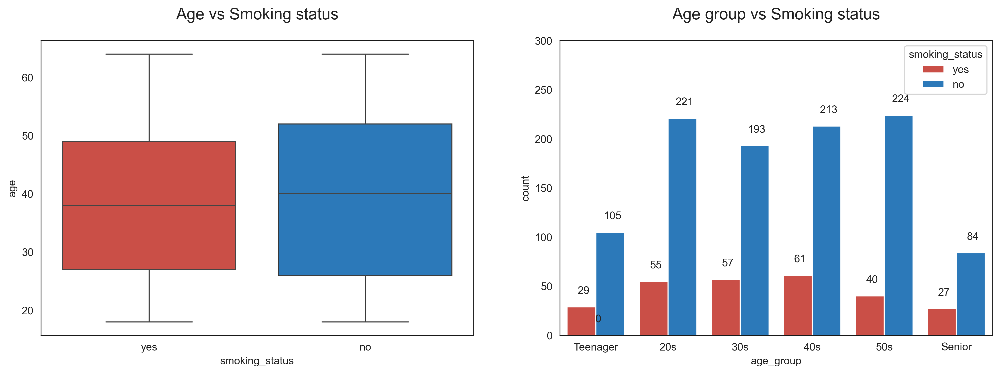

In [46]:
fig,ax=plt.subplots(1,2,figsize=(16,5),dpi=300)
sns.boxplot(x=data['smoking_status'],y=data['age'],hue=data['smoking_status'],ax=ax[0],palette=['#e03c31','#147bd1'])
plot=sns.countplot(x=data['age_group'],hue=data['smoking_status'],ax=ax[1],palette=['#e03c31','#147bd1'],order=['Teenager','20s','30s','40s','50s','Senior'])
for p in plot.patches:
    plot.annotate('{:.0f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),ha='center', va='center', xytext=(2, 15), textcoords='offset points')
plt.ylim(0,300)
ax[0].set_title('Age vs Smoking status',fontsize=15,pad=20)
ax[1].set_title('Age group vs Smoking status',fontsize=15,pad=20)
plt.show()

#### Looking at above plots we are not able to observe noticable difference in age between smokers and non-smokers, we can see in every age group we have both smokers and non smokers.

In [47]:
from scipy import stats

u_stat,p_value=stats.mannwhitneyu(data[data['smoking_status']=='yes']['age'],data[data['smoking_status']=='no']['age'])
print(p_value)

0.417464381381616


#### We have performed Mann Whitney U test to find out if there is any statiscally significant relation between age and smoking status or not. Our initial hypothesis was there is no significant relation between age and smoking status and after getting the p value we can say that there is no statistically significant relation between age and smoking status.

#### **BMI/BMI_group vs Smoking status**

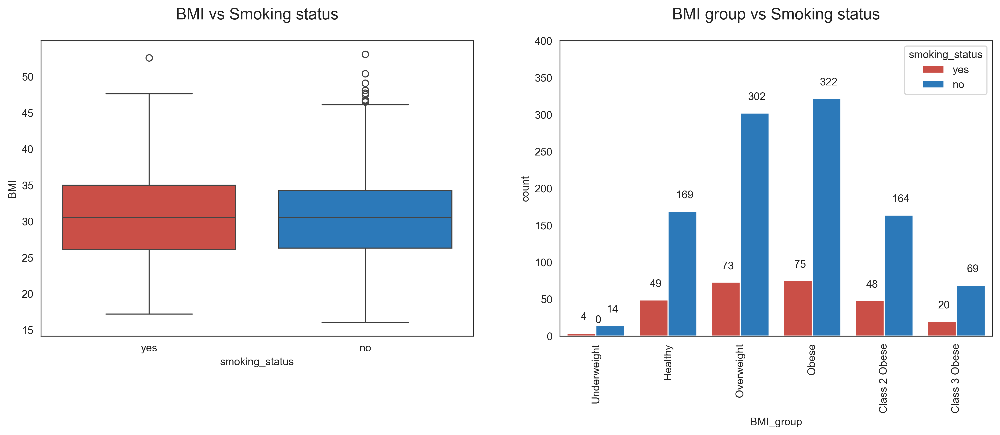

In [48]:
fig,ax=plt.subplots(1,2,figsize=(16,5),dpi=300)
sns.boxplot(x=data['smoking_status'],y=data['BMI'],hue=data['smoking_status'],ax=ax[0],palette=['#e03c31','#147bd1'])
plot=sns.countplot(x=data['BMI_group'],hue=data['smoking_status'],ax=ax[1],palette=['#e03c31','#147bd1'],order=['Underweight','Healthy','Overweight','Obese','Class 2 Obese','Class 3 Obese'])
for p in plot.patches:
    plot.annotate('{:.0f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),ha='center', va='center', xytext=(2, 15), textcoords='offset points')
plt.ylim(0,400)
ax[0].set_title('BMI vs Smoking status',fontsize=15,pad=20)
ax[1].set_title('BMI group vs Smoking status',fontsize=15,pad=20)
ax[1].tick_params(axis='x',rotation=90)
plt.show()

#### All the BMI group has both smokers and non smokers and the ratio is somewhat similar and we are not able to observe significant difference between smokers and non smokers for different bmi groups

In [49]:
from scipy import stats

u_stat,p_value=stats.ttest_ind(data[data['smoking_status']=='yes']['BMI'],data[data['smoking_status']=='no']['BMI'])
print(p_value)

0.927702033284775


#### We have performed independent sample ttest to find out if there is any statistically significant relation between BMI and smoking status or not because the distribution is close to normal. Our initial hypothesis was there is no significant relation between BMI and smoking status and after getting the p value we can say that there is no statistically significant relation between BMI and smoking status.

#### **Age vs BMI and Age group vs BMI group**

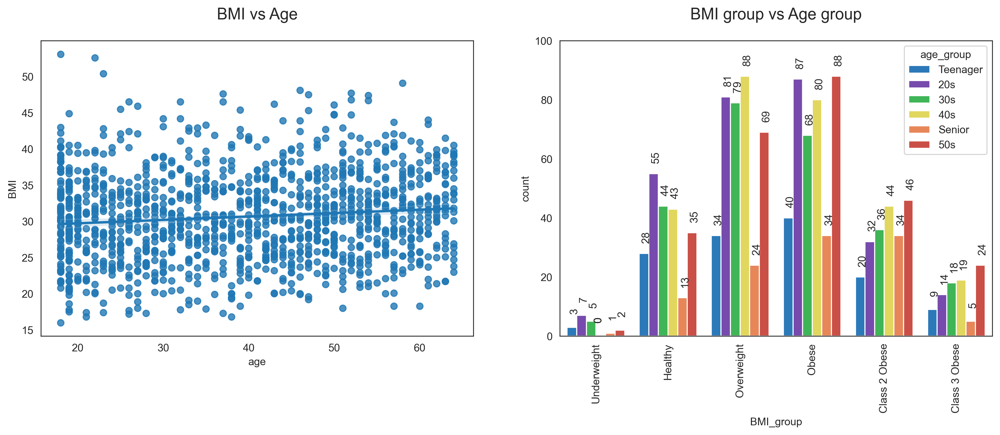

In [50]:
fig,ax=plt.subplots(1,2,figsize=(16,5),dpi=300)
sns.regplot(x=data['age'],y=data['BMI'],ax=ax[0])
plot=sns.countplot(x=data['BMI_group'],hue=data['age_group'],ax=ax[1],palette=['#147bd1','#753bbd','#2dc84d','#f7ea48','#ff7f41','#e03c31'],order=['Underweight','Healthy','Overweight','Obese','Class 2 Obese','Class 3 Obese'])
for p in plot.patches:
    plot.annotate('{:.0f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),ha='center', va='center', xytext=(2, 15), textcoords='offset points',rotation=90)
plt.ylim(0,100)
ax[0].set_title('BMI vs Age',fontsize=15,pad=20)
ax[1].set_title('BMI group vs Age group',fontsize=15,pad=20)
ax[1].tick_params(axis='x',rotation=90)
plt.show()

#### From the above plots we can see that there is no significant difference between age and bmi and each and every bmi groups has almost similar proportion of different age groups.

In [51]:
correlation, p_value = spearmanr(data['BMI'], data['age'])
print(p_value)
print(correlation)

9.280083671086935e-05
0.10782195464091973


#### After performing spearman correlation test although we are getting small p value which is suggesting that there is statistically significant relationship between age and BMI but the correlation coefficient is suggesting the relationship is very weak and might not be practically useful.

## **Multivariate Analysis**

#### **Age group and smoking_status vs Insurance price**

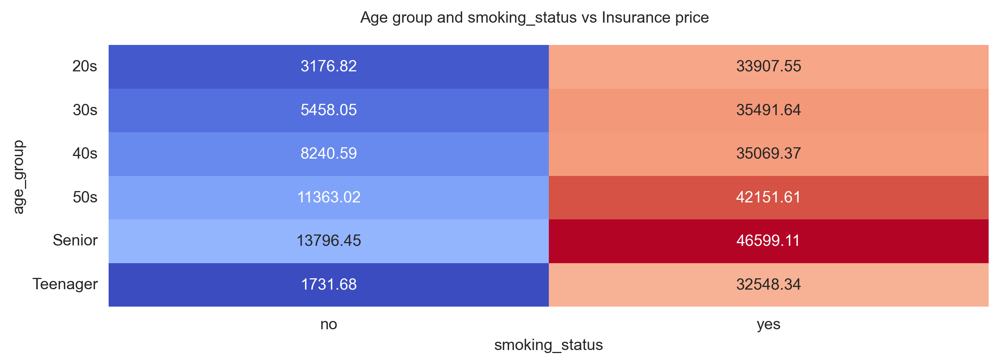

In [52]:
pivot_table = data.pivot_table(values='health_insurance_price', index='age_group', columns='smoking_status', aggfunc='median')
fig,ax=plt.subplots(1,1,figsize=(10,3),dpi=300)
sns.heatmap(pivot_table,annot=True,fmt='.2f',cmap='coolwarm',ax=ax,cbar=False)
fig.suptitle('Age group and smoking_status vs Insurance price',fontsize=10)
plt.show()

#### From the plots we can see that there is significant difference between the smokers and non-smokers in terms of health_insurance price. The relationship is linear but not unidirectional between every age groups and health insurance price for smokers and non-smokers. The ratio of median health insurance price between smokers and non-smokers for teenager is approx 19:1. For 20s the ratio is approx 10.7:1, for 30s the ratio is approx 6.5:1 times, for 40s the ratio is 4.25:1 approx, for 50s the ratio is 3.7:1 approx and for senior the ratio is 3.4:1 approx. So we have seen that the ratio of the median health insurance price between both smokers and non smokers are largest in teenagers whereas the same is smallest for seniors. We can see increment in health insurance prices based on age for both smokers and non-smokers. We can see a minor difference where for smokers the 30s age group are getting greater median health insurance price than 40s. We are observing relatively increased growth rate between 40s to 50s for median health insurance price between non smokers to smokers.

#### **Age group and BMI group vs Insurance price**

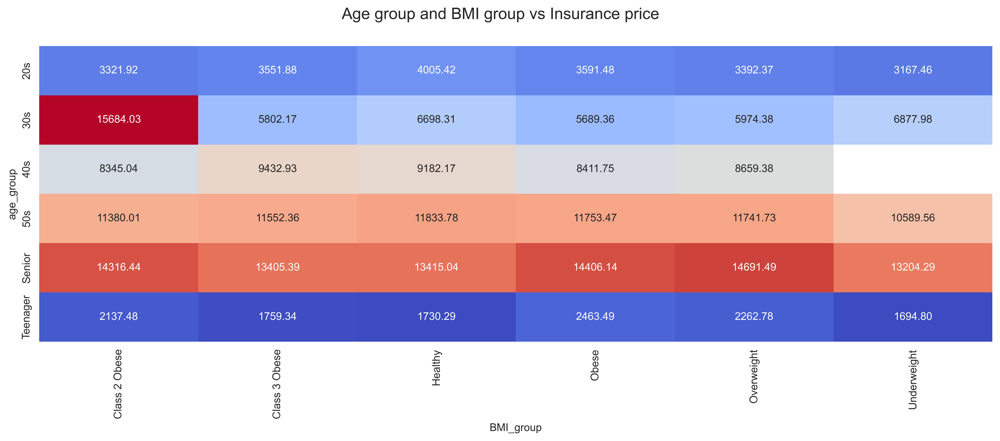

In [53]:
pivot_table = data.pivot_table(values='health_insurance_price', index='age_group', columns='BMI_group', aggfunc='median')
fig,ax=plt.subplots(1,1,figsize=(16,5),dpi=500)
for p in plot.patches:
    plot.annotate('{:.0f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),ha='center', va='center', xytext=(2, 15), textcoords='offset points',rotation=90)

sns.heatmap(pivot_table,annot=True,fmt='.2f',cmap='coolwarm',ax=ax,cbar=False)
fig.suptitle('Age group and BMI group vs Insurance price',fontsize=15)
plt.subplots_adjust(wspace=0.2)
ax.tick_params(axis='x', rotation=90)
plt.show()

#### From this plot we have observed that if we see the plot based on the BMI group in order like Underweight, Healthy, Overweight, Obese, Class 2 Obese, Class 3 Obese, then for Teenager the median health insurance price is increasing based on that order but only decreased between class 2 obese and class 3 obese.For 20s we can see decrease between healthy and overweight and obese and class 2 obese. For 30s we can see the price is decreasing based on the order instead of growth until obese and after that we have observed a sudden high growth in price for class 2 obese and then again noticible decrement after that for class 3 obese. For 40s we have no data for underweight and the price is decreasing for each bmi group but increased for class 3 obese. For 50s we are not noticing any noticible difference between the bmi groups , only seeing a small growth from underweight to healthy and then the rate of price changing is negligible. For Senior citizens we have seen a small growth from healthy to overweight then the rate of price changing is negligible.

#### **Smoking status and BMI group vs Insurance price**

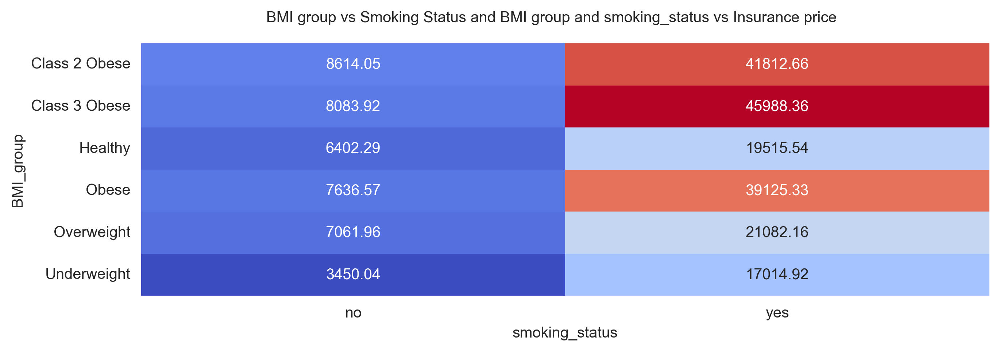

In [54]:
pivot_table = data.pivot_table(values='health_insurance_price', index='BMI_group', columns='smoking_status', aggfunc='median')
fig,ax=plt.subplots(1,1,figsize=(10,3),dpi=300)
sns.heatmap(pivot_table,annot=True,fmt='.2f',cmap='coolwarm',ax=ax,cbar=False)
fig.suptitle('BMI group vs Smoking Status and BMI group and smoking_status vs Insurance price',fontsize=10)
plt.subplots_adjust(wspace=0.3)
plt.show()

#### From the above plots we can see that there is significant difference between the smokers and non-smokers in terms of health_insurance price. The relationship is linear but not unidirectional that means we are seeing the BMI group in order like Underweight, Healthy, Overweight, Obese, Class 2 Obese, Class 3 Obese and we are observing based on that order the median health insurance price is increasing for both smokers and non-smokers, but for non-smokers the median health insurance price of class 2 obese is higher than class 3 obese. For smokers we can see a sudden very high growth from overweight to obese but after that the growth rate became like normal as it was for the previous 3 groups (Underweight, Healthy, Overweight). The ratio of median health insurance price between smokers and non-smokers for Underweight is approx 5:1. For Healthy the ratio is approx 3:1, for Overweight the ratio is approx 3:1, for Obese the ratio is approx 5:1, for Class 2 Obese the ratio is approx 4.85:1, for Class 3 Obese the ratio is approx 5.7:1.

## **More Analysis**

In [55]:
q1,q3=data['health_insurance_price'].quantile([0.25,0.75])
IQR=q3-q1
print(q3+(1.5*IQR))

34012.664625


#### From the above max limit of valid insurance price range and observing previous distribution of health insurance price we can say that price beyond 35000 of health insurance price are potential outliers.

In [56]:
tempdata=data[data['health_insurance_price']>35000]

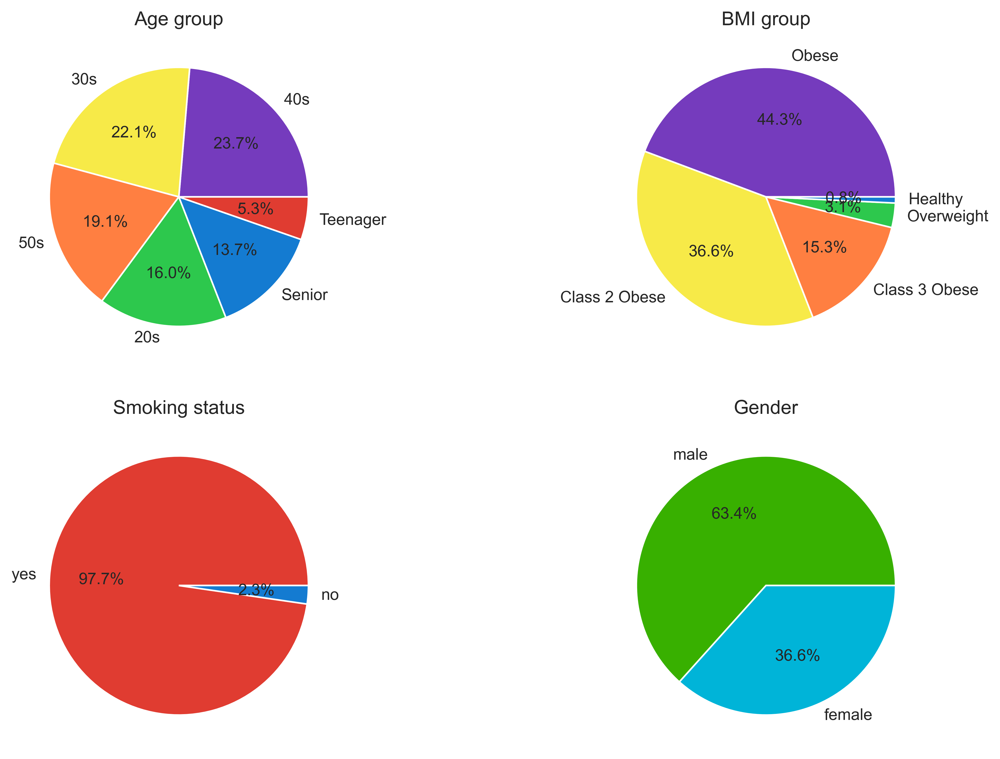

In [57]:
fig,ax=plt.subplots(2,2,figsize=(12,8),dpi=500)
ax[0,0].pie(tempdata['age_group'].value_counts().values,labels=tempdata['age_group'].value_counts().index,autopct='%1.1f%%',colors=['#753bbd','#f7ea48','#ff7f41','#2dc84d','#147bd1','#e03c31'])
ax[0,0].set_title('Age group')
ax[0,1].pie(tempdata['BMI_group'].value_counts().values,labels=tempdata['BMI_group'].value_counts().index,autopct='%1.1f%%',colors=['#753bbd','#f7ea48','#ff7f41','#2dc84d','#147bd1','#e03c31'])
ax[0,1].set_title('BMI group')
ax[1,0].pie(tempdata['smoking_status'].value_counts().values,labels=tempdata['smoking_status'].value_counts().index,autopct='%1.1f%%',colors=['#e03c31','#147bd1'])
ax[1,0].set_title('Smoking status')
ax[1,1].pie(tempdata['gender'].value_counts().values,labels=tempdata['gender'].value_counts().index,autopct='%1.1f%%',colors=['#38b000','#00b4d8'])
ax[1,1].set_title('Gender')
plt.show()

#### In the 1st chart we have see that the age groups are almost similarly distributed in every age group.
#### In 2nd chart the number of Obese and Class 2 Obese are higher.
#### In 3rd chart we have seen 97.7% of policyholders who have claimed very high insurance amount are smokers.
#### In 4th chart we have more numbers of males than female.

In [58]:
print(round(tempdata['age_group'].value_counts()/data['age_group'].value_counts()*100,2),'\n')

age_group
20s          7.61
30s         11.60
40s         11.31
50s          9.47
Senior      16.22
Teenager     5.22
Name: count, dtype: float64 



#### From this above findings we can see the number of teenagers claiming high health insurance value is lowest -> 5.22% of total teenagers and highest is for the seniors -> 16.22% of total seniors

In [59]:
tempdata[tempdata['age_group']=='Teenager'][['BMI_group','smoking_status']].value_counts()

BMI_group      smoking_status
Class 2 Obese  yes               3
Class 3 Obese  yes               2
Obese          yes               2
Name: count, dtype: int64

#### From the above findings we have observed that high insurance price claiming teenagers are smokers and obese and greater.

In [60]:
print(round(tempdata['BMI_group'].value_counts()/data['BMI_group'].value_counts()*100,2),'\n')

BMI_group
Class 2 Obese    22.64
Class 3 Obese    22.47
Healthy           0.46
Obese            14.61
Overweight        1.07
Underweight        NaN
Name: count, dtype: float64 



#### From this above findings we can see that there is no policyholders who are underweight. And the policyholders claiming high health insurance value are obese -> 14.61% of total obese people, class 2 obese -> 22.64% of total class 2 obese people and class 3 obese -> 22.47% of total class 3 obese people.

In [61]:
print(round(tempdata['smoking_status'].value_counts()/data['smoking_status'].value_counts()*100,2),'\n')

smoking_status
no      0.29
yes    47.58
Name: count, dtype: float64 



#### From the above findings we have observed that 47.58% of total smokers are claimed high health insurance value and non-smokers claimed high insurance price are only 0.29% of total non-smokers.

In [62]:
print(round(tempdata['gender'].value_counts()/data['gender'].value_counts()*100,2),'\n')

gender
male      12.54
female     7.42
Name: count, dtype: float64 



#### From the above findings we have observed that 12.54% of total males are claimed high health insurance value and females claimed high insurance price are 7.42% of total females.

## **Key Points**

#### **1)** Most numbers of policyholders are between the age from 20 years to less than 60 years.
#### **2)** Almost 83% policyholders have unhealthy BMI level form that 82% have overweight to obesity issue.
#### **3)** Almost 80% of policyholders are smokers.
#### **4)** Almost 80% of policyholders are having health insurance price under 20000 and from that almost 43% are having under 10000.
#### **5)** Median health insurance price is highest among seniors and lowest among teenagers.
#### **6)** Healthy people are claiming expensive health insurance than underweight and expensive health insurance are mostly claimed by Class 2 Obese people anc Class 3 Obese people are below that.
#### **7)** Median prices among males and females are very similar.
#### **8)** Smokers are getting significant high amounts of health insurance than non smokers the median price is 34472.84 for smokers and only 7348.93 for non-smokers.
#### **9)** 85% policyholders have 0-2 children and from them 43% has no children (0) and 24% approx has 1 children and 18% approx has 2 children.

## **Recommendations**

#### **=>** We have to encourage more healthy people to buy health insurance.
#### **=>** We can partner up with healthcare providers to control the cost of claims and encourage the policyholders to seek treatment from partnered healthcare providers for maximum benefits.
#### **=>** We can add extra benefits to the shorter insurance plans i.e. we can maximize the coverage limits for shorter plans such as maximum number of doctor visit, maximum number of medical test, coverage on prescribed medicines or even few free check ups from partnered healthcare providers.
#### **=>** We can adjust and reduce deductable and the amount the policyholder must pay for covered services for healthy people so that we can attract them and even include to cover limited pre medical condition only for healthy people.

## **Limitations**

#### **=>** We are missing few important columns for example 'Premium value', 'Deductable and Coinsurance value', 'Occupation', 'Coverage Limits', 'Activity' which could have helped to produce more actionable insights.
#### **=>** The number of observations could have been greater to give more idea about the population after analysis.

## **Conclusion**

#### Our objective was to do demographic analysis and find the relation of other details of policyholders with the health insurance price to move towards the business goal.We have analysed the distribution of data and did proper analysis with health insurance price to uncover patterns of the data and found out some key aspects of the data and also recommended few actionable insights to improve the business. We hope this insights will help insurance provider to improve their business.